음악의 온셋(onset)을 설명하고, 온셋을 감지하기 위해 변화를 포착하는 노벨티(novelty) 함수의 네 가지 종류를 설명하고 비교한다. 또한 피크-선택(peak-picking) 방법을 알아본다.

> 이 글은 [FMP(Fundamentals of Music Processing) Notebooks](https://www.audiolabs-erlangen.de/resources/MIR/FMP/C0/C0.html)을 참고로 합니다.

In [2]:
import numpy as np
from scipy import signal
from  matplotlib import pyplot as plt
import librosa
import librosa.display
import pandas as pd
from scipy.interpolate import interp1d
from scipy import ndimage
from scipy.ndimage import median_filter, gaussian_filter1d, maximum_filter1d, uniform_filter1d

import IPython.display as ipd
from IPython.display import Image, Audio

from utils.plot_tools import *
path_img = '../img/7.tempo_and_beat_tracking/'
path_data = '../data_FMP/'

# 음악적 온셋(Musical Onset)

- 음악적 온셋(onset)의 개념은 다소 모호할 수 있으며 어택(attack) 또는 과도/트랜지언트(trasient)과 같은 다른 개념과 관련이 있다.

- 피아노와 같은 악기에서 음을 연주할 때 음악 톤의 시작 부분에서 갑자기 에너지가 증가하는 경우가 많다. 음의 **트랜지언트**은 사운드가 쌓이는 단계를 말하며 일반적으로 진폭 엔벨로프가 급격히 증가한다. 트랜지언트는 일반적으로 음악 톤이나 소리의 이벤트 시작 부분에서 발생하는 짧은 지속 시간과 높은 진폭의 소음과 같은 사운드 구성 요소를 나타낸다. 어택 및 트랜지언트와 달리 음의 **온셋**(**onset**)은 트랜지언트의 시작을 표시하는 단일 순간(기간이 아님) 또는 트랜지언트를 안정적으로 감지할 수 있는 가장 빠른 시점을 나타낸다.

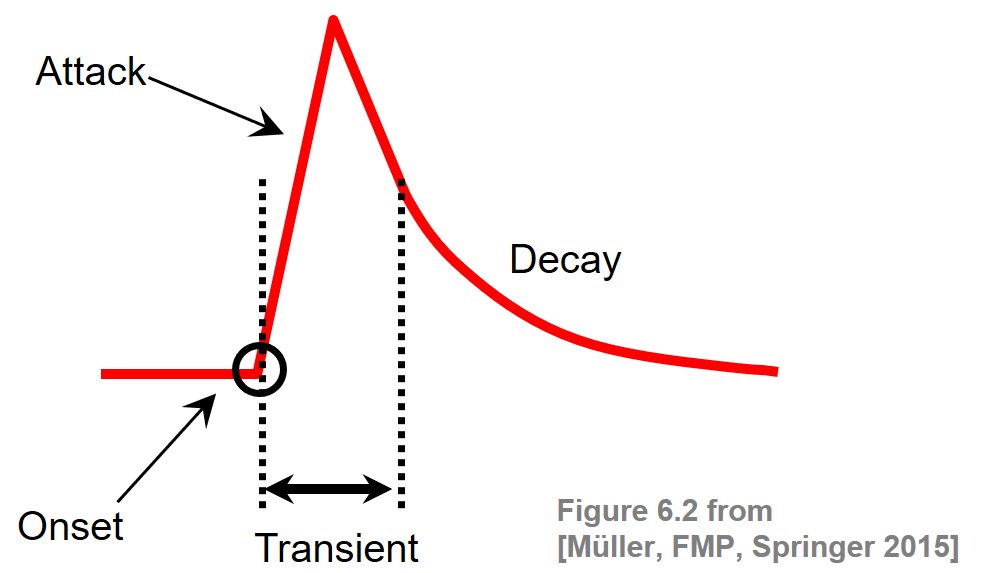

In [3]:
Image(path_img + "FMP_C6_F02b.png", width=400)

- 직관적으로 말해서 **온셋 감지**(**onset detection**)는 음악 녹음에서 발생하는 음 또는 기타 음악 이벤트의 시작 시간을 결정하는 작업이다. 신호에서 음 온셋을 감지하기 위한 일반적인 아이디어는 트랜지언트 영역의 시작을 알리는 갑작스러운 변화를 캡처하는 것이다. 

- 뚜렷한 어택 단계가 있는 음의 경우 신호의 진폭 엔벨로프가 증가하기 시작하는 시간 위치를 찾아 온셋 후보를 결정할 수 있다.

- 다음 그림에서는 딸깍 소리와 피아노 소리(음표 C4 연주)의 파형과 스펙트로그램을 보여준다.

In [4]:
def plot_wav_spectrogram(fn_wav, xlim=None, audio=True):
    """Plot waveform and computed spectrogram and may display audio
    """
    Fs = 22050
    x, Fs = librosa.load(fn_wav, sr=Fs) 
    plt.figure(figsize=(6,2)) 
    ax = plt.subplot(1,2,1)
    plot_signal(x, Fs, ax=ax)
    if xlim!=None: plt.xlim(xlim)
    ax = plt.subplot(1,2,2)
    N, H = 512, 256 
    X = librosa.stft(y=x, n_fft=N, hop_length=H, win_length=N, window='hann')
    Y = np.log(1 + 10 * np.abs(X))
    plot_matrix(Y, Fs=Fs/H, Fs_F=N/Fs, ax=[ax], colorbar=False)
    plt.ylim([0,5000])
    if xlim is not None: plt.xlim(xlim)
    plt.tight_layout()
    plt.show()
    if audio: ipd.display(ipd.Audio(x, rate=Fs))

In [5]:
fn_wav1 = 'FMP_C6_F04_Impulse.wav'
fn_wav2 = 'FMP_C6_F04_NoteC4_Piano.wav'

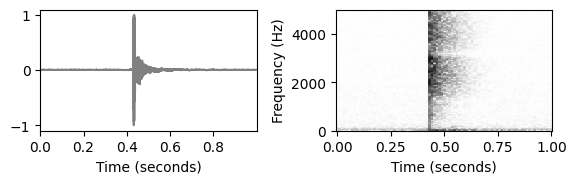

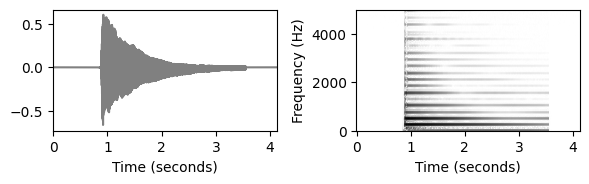

In [6]:
plot_wav_spectrogram(path_data+fn_wav1)
plot_wav_spectrogram(path_data+fn_wav2)

- 부드러운 온셋과 흐릿한 음 전환이 있는 비(非)타악기 음악과 같이 명확한 어택 단계가 없는 경우 온셋 감지가 훨씬 더 어렵다. 예를 들어 바이올린 소리의 파형은 피아노 소리처럼 급격한 변화가 아니라 느린 에너지 증가를 보일 수 있다. 부드러운 소리의 경우 정확한 시작 위치를 결정하거나 정의하기조차 어렵다. 

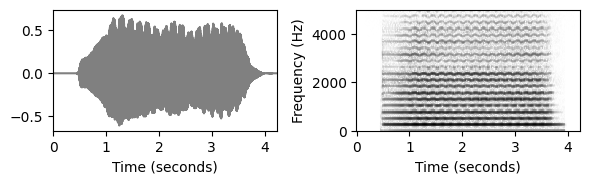

In [7]:
fn_wav3 = 'FMP_C3_NoteC4_Violin.wav'
plot_wav_spectrogram(path_data+fn_wav3)

- 복잡한 다성 음악을 다룰 때 개별 음의 시작점을 감지하는 것은 훨씬 더 어려워진다. 동시에 발생하는 사운드 이벤트는 신호 에너지의 중요한 변화를 측정할 수 없는 마스킹(masking) 효과를 초래할 수 있다. 

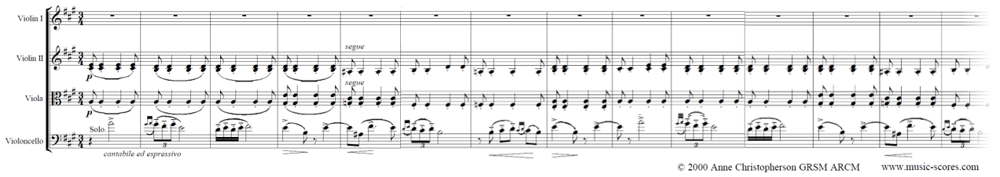

In [8]:
Image(path_img+"FMP_C6_Audio_Borodin-sec39_RWC_score.png", width=700)

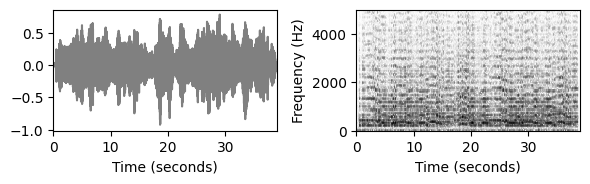

Plot of the first six seconds:


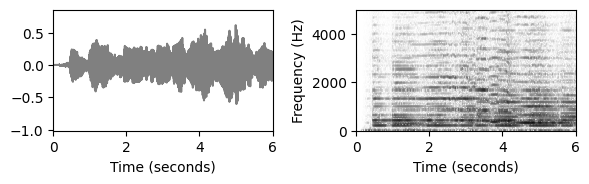

In [9]:
fn_wav4 = "FMP_C6_Audio_Borodin-sec39_RWC.wav"
plot_wav_spectrogram(path_data+fn_wav4, audio=False)

print('Plot of the first six seconds:')
plot_wav_spectrogram(path_data+fn_wav4, xlim=[0,6])

## 일반 파이프라인 (General Pipeline)

- 온셋 감지를 위한 많은 방식은 유사한 알고리즘 파이프라인을 따르지만 온셋 후보를 도출하기 위해 활용되는 신호 속성이 다르다. 이 파이프라인에서 주요 단계는 다음과 같다.
     * 먼저 신호는 관심 속성을 더 잘 반영하는 적절한 특징 표현으로 변환된다.
     * 그런 다음 특징 시퀀스에 미분 연산자 유형을 적용하고 **노벨티 함수(novelty function)** 를 도출한다.
     * 마지막으로 피크(peak) 선택 알고리즘을 사용하여 온셋 후보를 찾는다.

- 특히 주어진 음악 신호를 신호 에너지 또는 스펙트럼의 특정 변화를 캡처하는 **노벨티 표현**으로 변환하는 방법을 본다. 이러한 표현의 피크는 음의 온셋 후보에 대한 좋은 지표를 제공한다.

    * 에너지-기반 노벨티
    * 스펙트럼-기반 노벨티
    * 단계-기반 노벨티
    * 복소-영역 노벨티

## 예시: Another One Bites the Dust

- 예를 들어 Queen의 "Another one bites the dust"를 살펴보자. 베이스로만 연주되는 두 개의 16분 음표로 구성된 색다른 비트로 시작하여 네 개의 타악기 비트(킥 드럼, 스네어 드럼, 하이햇 및 베이스로 연주)가 이어진다. 또한 두 개의 후속 비트 사이에 추가 하이햇 스트로크가 있다. 다음 그림은 온셋 위치에 주석이 달린 파형을 보여준다.

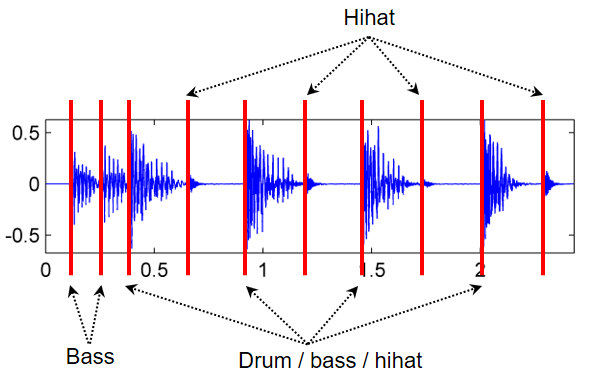

In [10]:
ipd.display(Image(path_img+"FMP_C6_F01a.png", width=400))
ipd.display(Audio(path_data+"FMP_C6_F01_Queen.wav"))

- 다음 스펙트로그램 표현은 4분음표 드럼 비트와 하이햇 사운드가 트랜지언트(수직선)와 함께 진행되는 반면 처음 두 개의 베이스 소리는 확산 온셋 속성이 더 크다는 것을 보여준다.

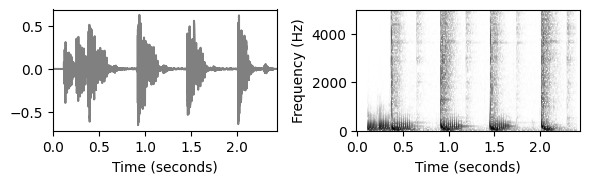

In [11]:
fn_wav = 'FMP_C6_F01_Queen.wav'
plot_wav_spectrogram(path_data+fn_wav, audio=False)

In [12]:
def read_annotation_pos(fn_ann, label='', header=True, print_table=False):
    """Read and convert file containing either list of pairs (number,label) or list of (number)

    Args:
        fn_ann (str): Name of file
        label (str): Name of label (Default value = '')
        header (bool): Assumes header (True) or not (False) (Default value = True)
        print_table (bool): Prints table if True (Default value = False)

    Returns:
        ann (list): List of annotations
        label_keys (dict): Dictionaries specifying color and line style used for labels
    """
    df = pd.read_csv(fn_ann, sep=';', keep_default_na=False, header=0 if header else None)
    if print_table:
        print(df)
    num_col = df.values[0].shape[0]
    if num_col == 1:
        df = df.assign(label=[label] * len(df.index))
    ann = df.values.tolist()

    label_keys = {'beat': {'linewidth': 2, 'linestyle': ':', 'color': 'r'},
                  'onset': {'linewidth': 1, 'linestyle': ':', 'color': 'r'}}
    return ann, label_keys

In [13]:
def compute_local_average(x, M):
    """Compute local average of signal
    Args:
        x (np.ndarray): Signal
        M (int): Determines size (2M+1) in samples of centric window  used for local average
    Returns:
        local_average (np.ndarray): Local average signal
    """
    L = len(x)
    local_average = np.zeros(L)
    for m in range(L):
        a = max(m - M, 0)
        b = min(m + M + 1, L)
        local_average[m] = (1 / (2 * M + 1)) * np.sum(x[a:b])
    return local_average


def compute_novelty_spectrum(x, Fs=1, N=1024, H=256, gamma=100.0, M=10, norm=True):
    """Compute spectral-based novelty function
    Args:
        x (np.ndarray): Signal
        Fs (scalar): Sampling rate (Default value = 1)
        N (int): Window size (Default value = 1024)
        H (int): Hop size (Default value = 256)
        gamma (float): Parameter for logarithmic compression (Default value = 100.0)
        M (int): Size (frames) of local average (Default value = 10)
        norm (bool): Apply max norm (if norm==True) (Default value = True)
    Returns:
        novelty_spectrum (np.ndarray): Energy-based novelty function
        Fs_feature (scalar): Feature rate
    """
    X = librosa.stft(y=x, n_fft=N, hop_length=H, win_length=N, window='hann')
    Fs_feature = Fs / H
    Y = np.log(1 + gamma * np.abs(X))
    Y_diff = np.diff(Y)
    Y_diff[Y_diff < 0] = 0
    novelty_spectrum = np.sum(Y_diff, axis=0)
    novelty_spectrum = np.concatenate((novelty_spectrum, np.array([0.0])))
    if M > 0:
        local_average = compute_local_average(novelty_spectrum, M)
        novelty_spectrum = novelty_spectrum - local_average
        novelty_spectrum[novelty_spectrum < 0] = 0.0
    if norm:
        max_value = max(novelty_spectrum)
        if max_value > 0:
            novelty_spectrum = novelty_spectrum / max_value
    return novelty_spectrum, Fs_feature

   position  label
0  0.117460  onset
1  0.247619  onset
2  0.372698   beat
3  0.646349  onset
4  0.911111   beat
5  1.184762  onset
6  1.445442   beat
7  1.735238  onset
8  2.000000   beat
9  2.287619  onset


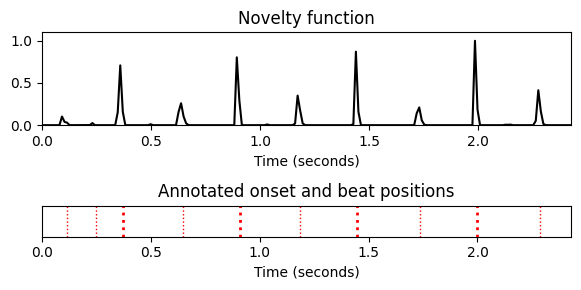

In [14]:
fn_ann = 'FMP_C6_F01_Queen.csv'
ann, label_keys = read_annotation_pos(path_data+fn_ann, print_table=True)

x, Fs = librosa.load(path_data+fn_wav)
x_duration = len(x)/Fs
nov, Fs_nov = compute_novelty_spectrum(x, Fs=Fs)

fig, ax = plt.subplots(2, 1, gridspec_kw={'height_ratios': [3, 1]}, figsize=(6, 3))
plot_signal(nov, Fs_nov, ax=ax[0], color='k', title='Novelty function');
plot_annotation_line(ann, ax=ax[1], label_keys=label_keys,
                    time_min=0, time_max=x_duration)
ax[1].set_title('Annotated onset and beat positions')
ax[1].set_xlabel('Time (seconds)')

plt.tight_layout()

- 마지막으로 피크 선택(peak picking) 전략을 적용하여 노벨티 함수의 **로컬 최대값** 또는 **피크**를 찾는다.

- 피크의 위치는 온셋 위치에 대한 후보이다. 다음 코드 셀에서는 [`scipy.signal.find_peaks`](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.find_peaks.html) 함수에서 제공하는 피크 선택 전략을 적용한다. 또한 원본 오디오 녹음에 추가된 클릭(click) 트랙을 통해 **음성화(sonification)** 와 함께 피크의 시각화를 생성한다.

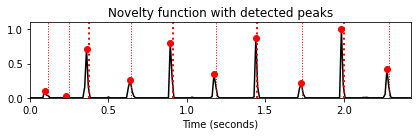

In [15]:
peaks, properties = signal.find_peaks(nov, prominence=0.02)
T_coef = np.arange(nov.shape[0]) / Fs_nov
peaks_sec = T_coef[peaks]
fig, ax, line = plot_signal(nov, Fs_nov, color='k', 
                    title='Novelty function with detected peaks')
plot_annotation_line(ann, ax=ax, label_keys=label_keys, 
                    nontime_axis=True, time_min=0, time_max=x_duration)
plt.plot(peaks_sec, nov[peaks], 'ro')
plt.show()

x_peaks = librosa.clicks(times=peaks_sec, sr=Fs, click_freq=1000, length=len(x)) # click sound
ipd.display(Audio(x + x_peaks, rate=Fs))

## Librosa 함수 예

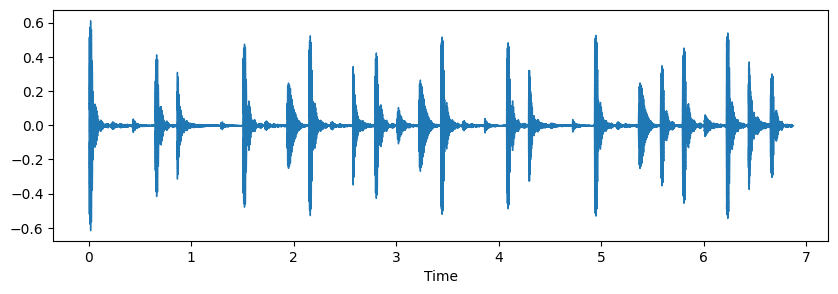

In [67]:
x, sr = librosa.load('../audio/classic_rock_beat.wav')
ipd.display(ipd.Audio(x, rate=sr))
plt.figure(figsize=(10, 3))
librosa.display.waveshow(y=x, sr=sr)
plt.show()

[`librosa.onset.onset_detect`]

In [77]:
onset_frames = librosa.onset.onset_detect(y=x, sr=sr, wait=1, pre_avg=1, post_avg=1, pre_max=1, post_max=1)
onset_times = librosa.frames_to_time(onset_frames)

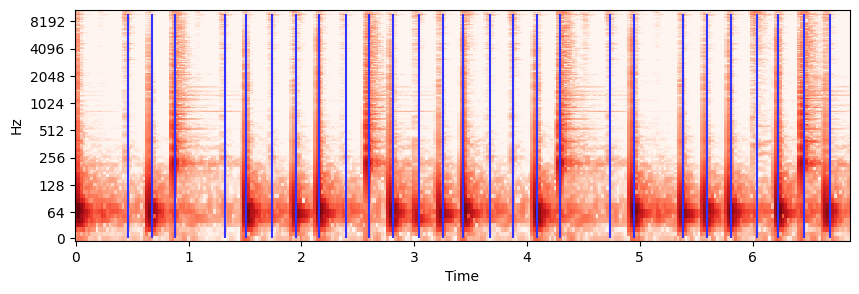

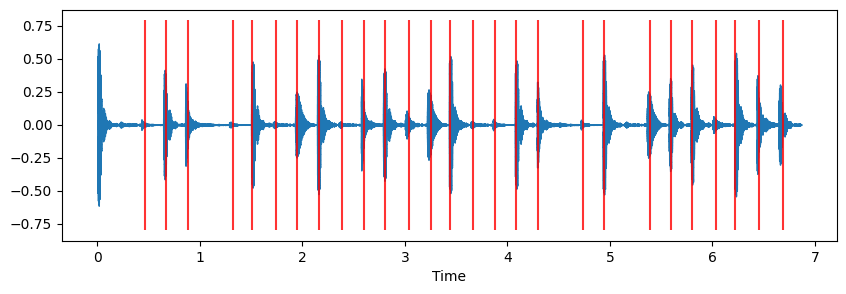

In [78]:
S = librosa.stft(x)
logS = librosa.amplitude_to_db(abs(S))

plt.figure(figsize=(10, 3))
librosa.display.specshow(logS, sr=sr, x_axis='time', y_axis='log', cmap='Reds')
plt.vlines(onset_times, 0, 10000, color='#3333FF')

plt.figure(figsize=(10, 3))
librosa.display.waveshow(x, sr=sr)
plt.vlines(onset_times, -0.8, 0.79, color='r', alpha=0.8) 

In [79]:
clicks = librosa.clicks(frames=onset_frames, sr=sr, length=len(x))
Audio(x + clicks, rate=sr)

# 노벨티 함수 (Novelty Functions)

## 에너지 기반 노벨티 (Energy-Based Novelty)

### 로컬(local) 에너지 함수

- 종종 음의 온셋은 신호 에너지의 갑작스러운 증가와 함께 진행된다.

- 이 가정에 기초하여 음 온셋을 감지하는 간단한 방법은 신호를 각 시간 인스턴스에 대한 신호의 로컬(local) 에너지를 나타내는 함수로 변환한 다음 이 함수에서 급격한 변화를 찾는 것이다.

- $x:\mathbb{Z}\to\mathbb{R}$를 DT(discrete time)-signal이라고 하자. 또한, $w:[-M:M]\to\mathbb{R}$ (for some $M\in\mathbb{N}$)를 시간 0을 중심으로 하는 종 모양의 윈도우 함수(예: Hann window)라고 하자.

- $w$에 대한 $x$의 **로컬 에너지**는 다음과 같이 주어진 함수 $E_w^x:\mathbb{Z}\to\mathbb{R}$로 정의된다.
$$E_w^x(n) := \sum_{m=-M}^{M} |x(n+m)w(m)|^2 = \sum_{m\in\mathbb{Z}}| x(m)w(m-n)|^2$$

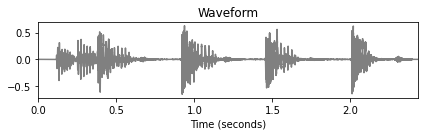

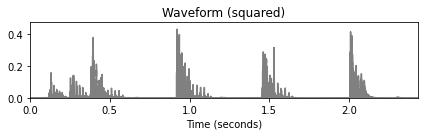

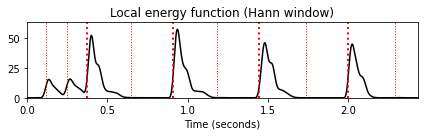

In [17]:
ann, label_keys = read_annotation_pos(path_data+fn_ann)

x, Fs = librosa.load(path_data+fn_wav) # Queen example
x_duration = len(x)/Fs

N = 2048
w = signal.hann(N)

#Calculate local energy
x_square = x**2
energy_local = np.convolve(x_square, w**2, 'same')

plot_signal(x, Fs, title='Waveform')
plot_signal(x_square, Fs, title='Waveform (squared)')
fig, ax, line = plot_signal(energy_local, Fs, color='k', 
                    title='Local energy function (Hann window)')
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                    nontime_axis=True, time_min=0, time_max=x_duration);
plt.tight_layout()

### 이산 미분과 반파 정류기 (Discrete Derivation and Half-Wave Rectification)

- 에너지 변화를 측정하기 위해 로컬 에너지 함수의 미분을 취한다. 불연속적인 경우, 그러한 도함수를 실현하는 가장 쉬운 방법은 두 개의 후속 에너지 값 사이의 차이를 취하는 것이다. 또한 우리는 에너지 증가(감소가 아닌)에 관심이 있기 때문에 양의 차이만 유지하고 음의 차이는 0으로 설정할 수 있다. 후자의 단계를 **반파 정류기**(**half-wave rectification**)라고 하며 다음과 같이 표기한다.
$$|r|_{\geq 0} := \frac{r+|r|}{2} =
   \left\{\begin{array}{ll}
    r, &\,\, \mbox{if $r\geq 0$,}\\
    0, &\,\, \mbox{if $r< 0$,}
\end{array}\right.$$
for $r\in\mathbb{R}$.



- 전체적으로 다음과 같이 주어진 **에너지 기반 노벨티 함수** $\Delta_\mathrm{Energy}:\mathrm{Z}\to\mathbb{R}$를 얻는다.

$$\Delta_\mathrm{energy}(n):= |E_w^x(n+1)-E_w^x(n)|_{\geq 0}$$

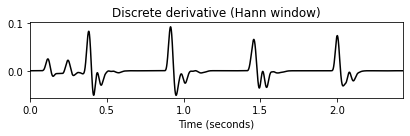

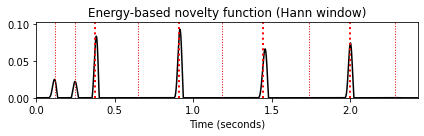

In [18]:
#Differentiation and half-wave rectification
energy_local_diff = np.diff(energy_local)
energy_local_diff = np.concatenate((energy_local_diff, np.array([0])))
novelty_energy = np.copy(energy_local_diff)
novelty_energy[energy_local_diff < 0] = 0

plot_signal(energy_local_diff, Fs, color='k', 
                    title='Discrete derivative (Hann window)')
fig, ax, line = plot_signal(novelty_energy, Fs, color='k',
                    title='Energy-based novelty function (Hann window)')
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                    nontime_axis=True, time_min=0, time_max=x_duration);
plt.tight_layout()

- 이 노벨티 함수는 타악기 비트에 많은 에너지가 포함되어 있음을 잘 나타낸다. 그러나 그 사이의 저에너지 하이햇 스트로크는 보이지 않는다. 또한 간단한 프레임별 차이 함수를 적용할 때 이 절차에서 종 모양의 Hann 윈도우에 의해 도입된 **스무딩(smoothing) 효과**가 필수적이라는 점에 유의해야 한다. 예를 들어 직사각형 윈도우를 대신 사용하면 차이 함수가 노이즈가 많은 에너지 함수로 이어지는 작은 로컬 변동에 반응한다.

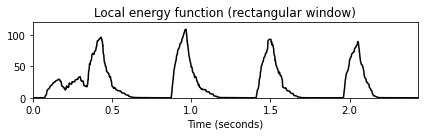

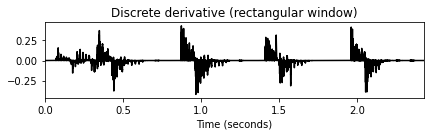

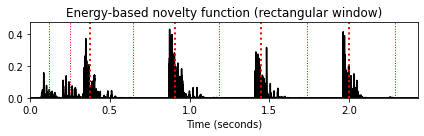

In [19]:
# Use rectangular window
w = signal.boxcar(N)
x_square = x**2
energy_local = np.convolve(x_square, w**2, 'same')
energy_local_diff = np.diff(energy_local)
energy_local_diff = np.concatenate((energy_local_diff, np.array([0])))
novelty_energy = np.copy(energy_local_diff)
novelty_energy[energy_local_diff < 0] = 0

fig, ax, line = plot_signal(energy_local, Fs, color='k',
                    title='Local energy function (rectangular window)')
plot_signal(energy_local_diff, Fs, color='k', 
                    title='Discrete derivative (rectangular window)')
fig, ax, line = plot_signal(novelty_energy, Fs, color='k', title='Energy-based novelty function (rectangular window)')
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                    nontime_axis=True, time_min=0, time_max=x_duration);
plt.tight_layout()

### 로그 압축 (Logarithmic Compression)

- 소리 강도(intensity)에 대한 인간의 인식이 본질적으로 대수적(logarithmic)이라는 사실을 설명하기 위해 예를 들어 로그 데시벨로 전환하거나 로그 압축을 적용하여 에너지 값에 로그를 적용하는 경우가 많다.
- 후자의 경우 $\Gamma_\gamma:\mathbb{R}_{>0} \to \mathbb{R}_{>0}$ 함수를 사용한다.
$$\Gamma_\gamma(v):=\log(1+ \gamma \cdot v)$$
(양의 상수 $\gamma\in\mathbb{R}_{>0}$는 압축 정도를 조절)

- 그 결과 노벨티 함수는 다음과 같이 주어진다.
$$\Delta_\mathrm{Energy}^\mathrm{Log}(n):= |\Gamma_\gamma(E_w^x(n+1))-\Gamma_\gamma(E_w^x(n))|_{\geq 0}$$
    
- 윈도우 길이 $N$ 외에도 다음 구현에서 홉 크기 매개변수 $H$를 도입하여 계산된 노벨티의 특징 샘플링 비율을 줄일 수 있다. 또한 최대값으로 나누어 노벨티 함수를 정규화한다. 다음 그림에서 로그 노벨티 함수를 사용했을 때 약한 하이햇 온셋 부분이 표시되는 것을 관찰할 수 있다 ($t=1.3~\mathrm{sec}$ 및 $t=2.3~\mathrm{sec}$ 참조). 

- 로그 압축의 단점으로 일부 소음과 같은 소리 구성 요소가 증폭되어 거짓의 피크가 발생할 수 있다. 이 예에서 볼 수 있듯이 로그 압축은 또한 일부 피크 위치를 앞으로 이동하여 이제 참조 주석(빨간색으로 표시됨) 앞에 있다. 청취자가 수동으로 생성한 참조 주석이 약간 지연된 "인식된" 온셋 위치에 해당함을 알 수 있다.

In [20]:
def compute_novelty_energy(x, Fs=1, N=2048, H=128, gamma=10.0, norm=True):
    """Compute energy-based novelty function

    Args:
        x (np.ndarray): Signal
        Fs (scalar): Sampling rate (Default value = 1)
        N (int): Window size (Default value = 2048)
        H (int): Hop size (Default value = 128)
        gamma (float): Parameter for logarithmic compression (Default value = 10.0)
        norm (bool): Apply max norm (if norm==True) (Default value = True)

    Returns:
        novelty_energy (np.ndarray): Energy-based novelty function
        Fs_feature (scalar): Feature rate
    """
    # x_power = x**2
    w = signal.hann(N)
    Fs_feature = Fs / H
    energy_local = np.convolve(x**2, w**2, 'same')
    energy_local = energy_local[::H]
    if gamma is not None:
        energy_local = np.log(1 + gamma * energy_local)
    energy_local_diff = np.diff(energy_local)
    energy_local_diff = np.concatenate((energy_local_diff, np.array([0])))
    novelty_energy = np.copy(energy_local_diff)
    novelty_energy[energy_local_diff < 0] = 0
    if norm:
        max_value = max(novelty_energy)
        if max_value > 0:
            novelty_energy = novelty_energy / max_value
    return novelty_energy, Fs_feature

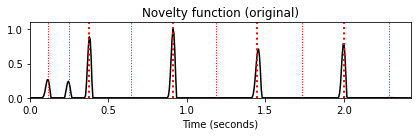

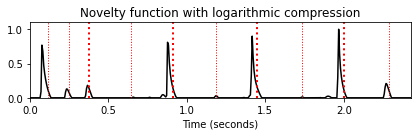

In [21]:
N = 2048
H = 128
nov_1, Fs_nov = compute_novelty_energy(x, Fs=Fs, N=N, H=H, gamma=None)
nov_2, Fs_nov = compute_novelty_energy(x, Fs=Fs, N=N, H=H, gamma=1000)

fig, ax, line = plot_signal(nov_1, Fs=Fs_nov, color='k', 
                    title='Novelty function (original)')
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                    nontime_axis=True, time_min=0, time_max=x_duration);

fig, ax, line = plot_signal(nov_2, Fs=Fs_nov, color='k',
                    title='Novelty function with logarithmic compression')
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                    nontime_axis=True, time_min=0, time_max=x_duration);

### 예시: 악기에 따라

- 온셋 감지의 또 다른 일반적인 문제는 비브라토 또는 트레몰로의 결과로 인한 비정상(nonsteady) 소리의 에너지 변동이다. 특히 순전히 에너지 기반의 절차의 경우 진폭 변조는 결과로 나타나는 노벨티 함수에서 가짜 피크로 이어지는 경우가 많다.

- 다른 악기로 연주되는 음 C4에 대한 에너지 기반 노벨티 함수를 보여주는 다음 예를 보자. 노벨티 함수는 피아노 소리의 경우 하나의 선명한 피크를 나타내지만 바이올린이나 플루트 소리의 경우 추가 피크가 많이 있다. 게다가, 바이올린 소리의 시작 부분에서 상대적으로 느린 에너지 증가는 얼룩지고 일시적으로 부정확한 온셋 피크로 이어진다.

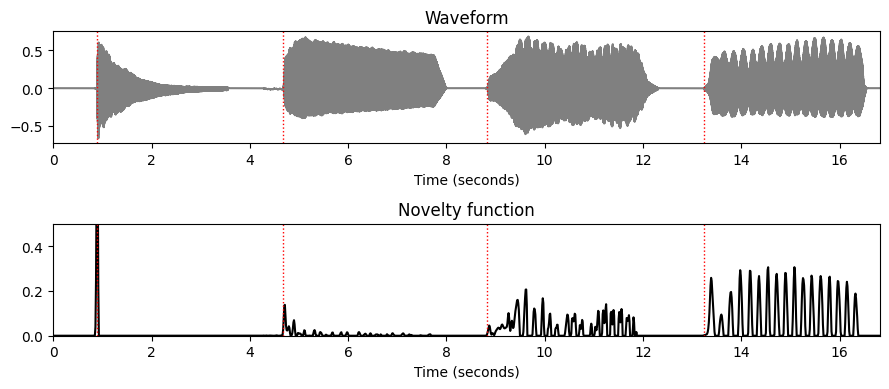

In [22]:
fn_ann = 'FMP_C6_F04_NoteC4_PTVF.csv'
ann, label_keys = read_annotation_pos(path_data+fn_ann, label='onset', header=0)

fn_wav = 'FMP_C6_F04_NoteC4_PTVF.wav'
x, Fs = librosa.load(path_data+fn_wav)
x_duration = len(x)/Fs
N = 2048
H = 256
nov, Fs_nov = compute_novelty_energy(x, Fs=Fs, N=N, H=H, gamma=None)

plt.figure(figsize=(9,4))
ax = plt.subplot(2,1,1)
fig, ax, line = plot_signal(x, Fs, ax = ax, title='Waveform')
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                    nontime_axis=True, time_min=0, time_max=x_duration)

ax = plt.subplot(2,1,2)
fig, ax, line = plot_signal(nov, Fs=Fs_nov, ax = ax, color='k', 
                     title='Novelty function')
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                nontime_axis=True, time_min=0, time_max=x_duration)
plt.ylim([0, 0.5]);
plt.tight_layout()

ipd.display(Audio(data=x, rate=Fs))

### Librosa 함수 예제

(49613,) 22050


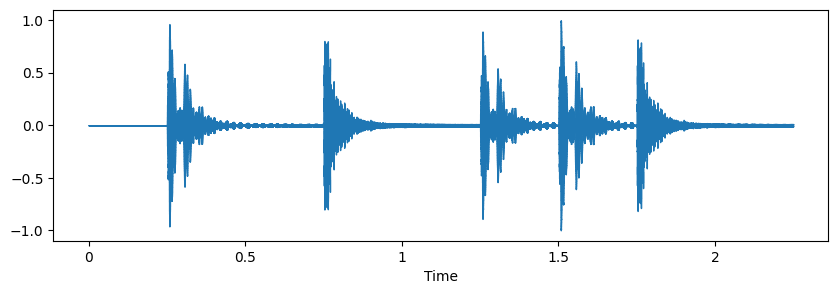

In [81]:
x, sr = librosa.load('../audio/simple_loop.wav')
print(x.shape, sr)

ipd.display(Audio(x, rate=sr))
plt.figure(figsize=(10, 3))
librosa.display.waveshow(x, sr=sr)
plt.show()

In [85]:
# rms energy

hop_length = 512
frame_length = 1024
rmse = librosa.feature.rms(y=x, frame_length=frame_length, hop_length=hop_length).flatten()
rmse_diff = np.zeros_like(rmse)
rmse_diff[1:] = np.diff(rmse)

In [86]:
print(rmse.shape)
print(rmse_diff.shape)

(97,)
(97,)


In [89]:
energy_novelty = np.max([np.zeros_like(rmse_diff), rmse_diff], axis=0)

frames = np.arange(len(rmse))
t = librosa.frames_to_time(frames, sr=sr)

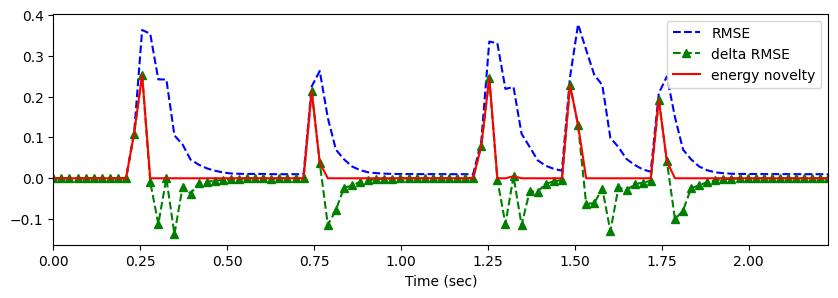

In [91]:
plt.figure(figsize=(10, 3))
plt.plot(t, rmse, 'b--', t, rmse_diff, 'g--^', t, energy_novelty, 'r-')
plt.xlim(0, t.max())
plt.xlabel('Time (sec)')
plt.legend(('RMSE', 'delta RMSE', 'energy novelty')) 
plt.show()

In [92]:
#log energy

log_rmse = np.log1p(10*rmse)
log_rmse_diff = np.zeros_like(log_rmse)
log_rmse_diff[1:] = np.diff(log_rmse)

In [93]:
log_energy_novelty = np.max([np.zeros_like(log_rmse_diff), log_rmse_diff], axis=0)

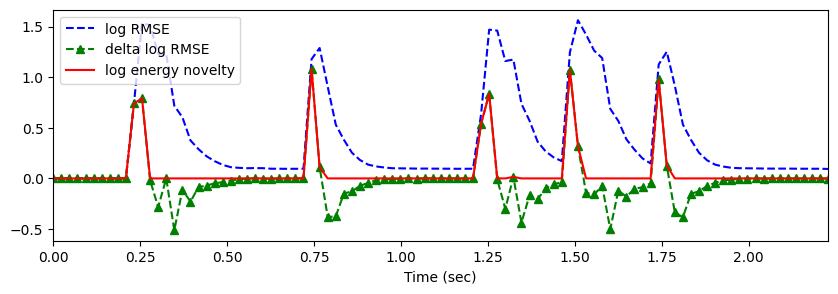

In [96]:
plt.figure(figsize=(10, 3))
plt.plot(t, log_rmse, 'b--', t, log_rmse_diff, 'g--^', t, log_energy_novelty, 'r-')
plt.xlim(0, t.max())
plt.xlabel('Time (sec)')
plt.legend(('log RMSE', 'delta log RMSE', 'log energy novelty')) 

## 스펙트럼 기반 노벨티 (Spectral-Based Novelty)

### 스펙트럼 기반 노벨티

- 동시에 발생하는 소리 이벤트가 있는 다성 음악의 경우 온셋 감지는 종종 어렵고 정의가 어려운 문제가 된다. 예를 들어, 낮은 강도의 음악 이벤트는 높은 강도의 이벤트에 의해 가려질 수 있다. 그러나 잡음과 같은 광대역 트랜지언트는 다성 혼합에서도 특정 주파수 대역에서 여전히 관찰될 수 있다.

- 이러한 관찰에 동기를 부여받은 **스펙트럼 기반 노벨티 탐지**의 아이디어는 먼저 신호를 시간-주파수 표현으로 변환하고 그런 다음 주파수 내용의 변경 사항을 캡처하는 것이다.

- 다음에서 $\mathcal{X}$를 샘플링 속도 $F_\mathrm{s}$, 윈도우 길이 $N$, 홉 사이즈 $H$ 을 사용한 DT-신호 $x$의 이산 STFT라고 하자.

- $\mathcal{X}(n,k)\in\mathbb{C}$는 주파수 인덱스 $k\in[0:K]$ 및 시간 프레임 $n\in\mathbb{Z}$에 대한 $k^\mathrm{th}$ 푸리에 계수를 나타낸다. 여기서 $K=N/2$는 Nyquist 주파수에 해당하는 주파수 인덱스이다.

- 신호의 스펙트럼 변화를 감지하기 위해 기본적으로 적절한 거리 측정을 사용하여 후속 스펙트럼 벡터 간의 차이를 계산한다. 그 결과 **스펙트럼 플럭스(spectral flux)** 라고도 하는 **스펙트럼 기반 노벨티 함수**가 생성된다.

- STFT와 거리 측정의 매개변수뿐만 아니라 종종 적용되는 전처리 및 후처리 단계에 따라 달라지는 노벨티 함수를 계산하는 방법에는 여러 가지가 있다.

### 로그 압축

- 먼저 약한 스펙트럼 성분을 강화하기 위해 **로그 압축**을 스펙트럼 계수에 적용한다. 이를 위해 크기 스펙트로그램 $|\mathcal{X}|$에 $\Gamma_\gamma$ 함수를 적용하면 다음을 얻는다.
$$\mathcal{Y}:=\Gamma_\gamma(|\mathcal{X}|)=\log(1+ \gamma \cdot |\mathcal{X}|)$$
(적절한 상수 $\gamma \geq 1$에 대해)

- $\gamma=1$로 압축된 스펙트로그램을 사용하면 트랜지언트의 수직 구조가 더욱 두드러진다. 연속된 비트 사이의 하이햇의 약한 트랜지언트도 표시된다. $\gamma$를 높이면 특히 스펙트로그램의 고주파수 범위에서 낮은 강도 값이 더욱 향상된다. 단점으로는 압축 계수 $\gamma$가 크면 관련 없는 노이즈와 같은 구성 요소가 증폭될 수도 있다.

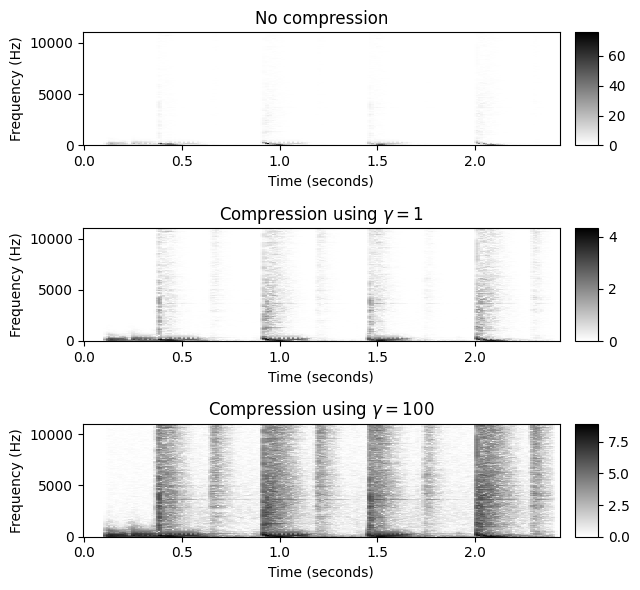

In [23]:
fn_ann = "FMP_C6_F01_Queen.csv"
ann, label_keys = read_annotation_pos(path_data+fn_ann)

fn_wav = 'FMP_C6_F01_Queen.wav'

x, Fs = librosa.load(path_data+fn_wav)
x_duration = len(x)/Fs
N, H = 1024, 256
X = librosa.stft(y=x, n_fft=N, hop_length=H, win_length=N, window='hann')

fig, ax = plt.subplots(3, 2, gridspec_kw={'width_ratios': [1, 0.05], 'height_ratios': [1, 1, 1]}, figsize=(6.5, 6))        

Y = np.abs(X)
plot_matrix(Y, Fs=Fs/H, Fs_F=N/Fs, ax=[ax[0,0], ax[0,1]], title='No compression')

gamma = 1
Y = np.log(1 + gamma * np.abs(X))
plot_matrix(Y, Fs=Fs/H, Fs_F=N/Fs, ax=[ax[1,0], ax[1,1]], title='Compression using $\gamma=%0.0f$'%gamma)

gamma = 100
Y = np.log(1 + gamma * np.abs(X))
plot_matrix(Y, Fs=Fs/H, Fs_F=N/Fs, ax=[ax[2,0], ax[2,1]], title='Compression using $\gamma=%0.0f$'%gamma)
plt.tight_layout()

### 이상 미분, 반파 정류기, 누적

- 다음 단계에서는 압축된 스펙트럼 $\mathcal{Y}$의 이산 시간 도함수를 계산한다. 에너지 기반 노벨티 함수와 유사하게 **반파 정류기**(**half-wave rectification**)를 적용하여 양의 차이(강도 증가)만 고려하고 음의 차이는 버린다. 마지막으로 주파수 축(**누적** 단계)에서 양의 차이를 합산하여 **스펙트럼 기반 노벨티 함수** $\Delta_\mathrm{Spectral}:\mathbb{Z}\to \mathbb{R}$를 얻는다.
$$\Delta_\mathrm{Spectral}(n):= \sum_{k=0}^K  \big|\mathcal{Y}(n+1,k)-\mathcal{Y}(n,k)\big|_{\geq 0}$$
for $n\in\mathbb{Z}$. 

- Queen 예에서, 결과의 노벨티 곡선은 사이사이의 낮은 에너지 하이햇 스트로크뿐만 아니라 높은 에너지를 가진 타악기 비트를 잘 나타낸다.

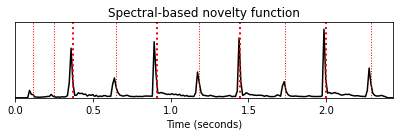

In [24]:
Y = np.log(1 + 100 * np.abs(X))
Y_diff = np.diff(Y, n=1)
Y_diff[Y_diff < 0] = 0
nov = np.sum(Y_diff, axis=0)
nov = np.concatenate((nov, np.array([0])))
Fs_nov = Fs/H

fig, ax, line = plot_signal(nov, Fs_nov, color='k', title='Spectral-based novelty function')
plot_annotation_line(ann, ax=ax, label_keys=label_keys,  time_min=0, time_max=x_duration);

### 로컬 평균 빼기

- 적절한 후처리 단계를 적용하여 노벨티 함수의 속성을 더욱 향상시킬 수 있다. 예를 들어, 연속의 피크 선택 단계의 관점에서 한가지 목적은 작은 변동을 억제하면서 노벨티 함수의 피크 구조를 향상시키는 것일 수 있다.

- 이를 위해 로컬 평균 함수 $\mu:\mathbb{Z}\to\mathbb{R}$를 다음과 같이 설정한다.
$$\mu(n):= \frac{1}{2M+1}\sum_{m=-M}^M \Delta_\mathrm{Spectral}(n+m)$$
for $n\in\mathbb{Z}$, 여기서 $M\in\mathbb{N}$ 매개변수는 평균 창의 크기를 결정

- 향상된 노벨티 함수 $\bar{\Delta}_\mathrm{Spectral}$은 $\Delta_\mathrm{Spectral}$에서 로컬 평균을 빼고 양수 부분만 유지하여 얻는다(half-wave rectification).
$$\bar{\Delta}_\mathrm{Spectral}(n):= \big|\Delta_\mathrm{Spectral}(n)-\mu(n)\big|_{\geq 0}$$
for $n\in\mathbb{Z}$. 

- 다음 구현에서는 평균 윈도우 길이를 초 단위로 지정한다. 또한 결과 노벨티 함수를 최대값으로 나누어 정규화한다.

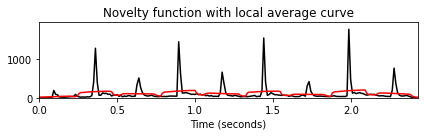

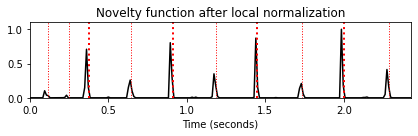

In [25]:
M_sec = 0.1
M = int(np.ceil(M_sec * Fs_nov))

local_average = compute_local_average(nov, M)
nov_norm =  nov - local_average
nov_norm[nov_norm<0]=0
nov_norm = nov_norm / max(nov_norm)

plot_signal(nov, Fs_nov, color='k', 
    title='Novelty function with local average curve');

t_novelty = np.arange(nov.shape[0]) / Fs_nov
plt.plot(t_novelty, local_average, 'r')
plt.tight_layout()

fig, ax, line = plot_signal(nov_norm, Fs_nov, color='k', 
                    title='Novelty function after local normalization')
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                    nontime_axis=True, time_min=0, time_max=x_duration);

- 전체 절차를 `compute_novelty_spectrum` 함수로 보자.
- 스펙트럼 기반과 에너지 기반 노벨티 곡선을 비교해보자.

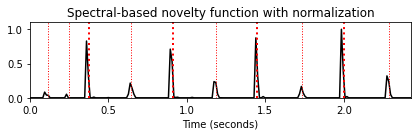

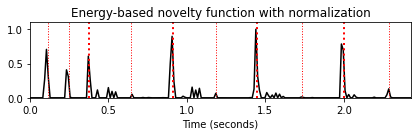

In [26]:
nov, Fs_nov = compute_novelty_spectrum(x, Fs=Fs, N=1024, H=256, gamma=10, M=10, norm=True)
fig, ax, line = plot_signal(nov, Fs_nov, color='k', 
                    title='Spectral-based novelty function with normalization')
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                    nontime_axis=True, time_min=0, time_max=x_duration);

nov, Fs_nov = compute_novelty_energy(x, Fs=Fs, N=1024, H=256, gamma=10)
fig, ax, line = plot_signal(nov, Fs_nov, color='k',
                    title='Energy-based novelty function with normalization')
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                    nontime_axis=True, time_min=0, time_max=x_duration);

### Librosa 함수 예제

In [101]:
sr = 22050

def generate_tone(midi):
    T = 0.5
    t = np.linspace(0, T, int(T*sr), endpoint=False)
    f = librosa.midi_to_hz(midi)
    return np.sin(2*np.pi*f*t)

x = np.concatenate([generate_tone(midi) for midi in [48, 52, 55, 60, 64, 67, 72, 76, 79, 84]])
Audio(x, rate=sr)

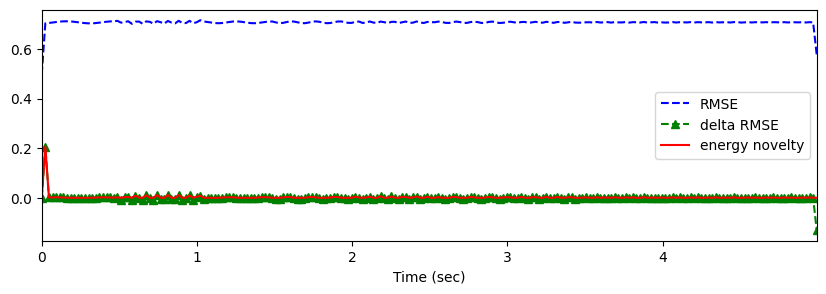

In [110]:
# energy 기반의 경우
hop_length = 512
frame_length = 1024
rmse = librosa.feature.rms(y=x, frame_length=frame_length, hop_length=hop_length).flatten()
rmse_diff = np.zeros_like(rmse)
rmse_diff[1:] = np.diff(rmse)
energy_novelty = np.max([np.zeros_like(rmse_diff), rmse_diff], axis=0)
frames = np.arange(len(rmse))
t = librosa.frames_to_time(frames, sr=sr)
plt.figure(figsize=(10, 3))
plt.plot(t, rmse, 'b--', t, rmse_diff, 'g--^', t, energy_novelty, 'r-')
plt.xlim(0, t.max())
plt.xlabel('Time (sec)')
plt.legend(('RMSE', 'delta RMSE', 'energy novelty')) 
plt.show()

`librosa.onset.onset_strength`

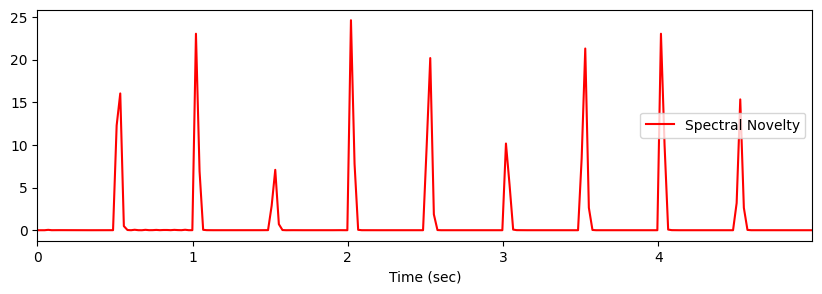

In [113]:
spectral_novelty = librosa.onset.onset_strength(y=x, sr=sr)

frames = np.arange(len(spectral_novelty))
t = librosa.frames_to_time(frames, sr=sr)

plt.figure(figsize=(10,3))
plt.plot(t, spectral_novelty, 'r-')
plt.xlim(0, t.max())
plt.xlabel('Time (sec)')
plt.legend(('Spectral Novelty',))
plt.show()

## 위상-기반 노벨티 (Phase-Based Novelty)

### 위상 표현 (Phase Representation)

- 스펙트럼 기반 노벨티 함수의 정의에서는 스펙트럼 계수(Spectral Coefficient)의 크기만을 사용하였다.

- 이제 위상(phase) 정보가 온셋 감지에 어떻게 사용될 수 있는지 본다. 특히 고정음(stationary tones)은 위상(phase)이 안정적이고 과도음(transient)은 위상이 불안정하다는 사실을 이용한다.

- $\mathcal{X}$를 샘플링 속도 $F_\mathrm{s}$, 윈도우 길이 $N$ 및 홉 크기 $H$를 사용한 DT 신호 $x$의 이산 STFT라고 하자. 극좌표(polar coordinate representation)를 사용하면 복소 계수 $\mathcal{X}(n,k)\in\mathbb{C}$를 다음과 같이 쓸 수 있다.
$$\mathcal{X}(n,k)= |\mathcal{X}(n,k)| \,\,\mathrm{exp}(2\pi i\varphi(n,k))$$
with the phase $\varphi(n,k)\in[0,1)$

- 직관적으로 위상 $\varphi(n,k)$는 주파수 $F_\mathrm{coef}(k)= F_\mathrm{s}\cdot k/N$의 정현파(sinusoid)가 $n^{\mathrm{th}}$ 프레임에 해당하는 윈도우 신호로 최상의 상관관계를 갖기 위해 어떻게 이동해야 하는지를 결정한다.

- 신호 $x$가 이 정현파와 높은 상관관계를 가지며(즉, $|\mathcal{X}(n,k)|$가 큼) 여러 후속 프레임 $\ldots,n-2,n-1,n,n+1,\ldots$에서 꾸준한 동작을 보인다고 가정하자. 그런 다음 위상 $\ldots,\varphi(n-2,k)$, $\varphi(n-1,k)$, $\varphi(n,k)$, $\varphi(n+1,k),\ldots$는 STFT의 홉 크기 $H$에서 선형으로 프레임마다 증가한다. 따라서 이 영역의 프레임별 위상차는 대략 일정하게 유지된다.
$$\varphi(n,k)- \varphi(n-1,k) \approx \varphi(n-1,k)- \varphi(n-2,k)$$
    
    
- 다음 그림에 위상의 각도 표현이 원으로 표시되어 있다.

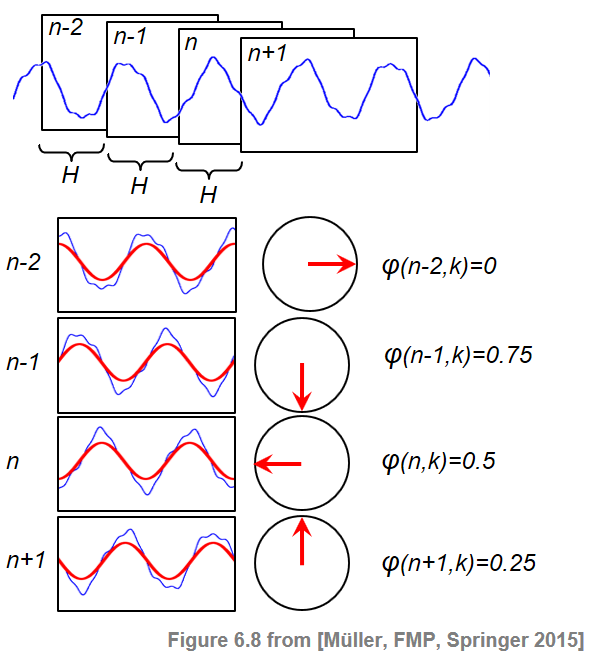

In [27]:
Image(path_img+"FMP_C6_F08.png")

### 주요 편각 함수 (Principal Argument Function)

- 위상차를 고려할 때, 위상이 주기적이라는 사실로 인한 **위상 래핑(wrapping)** 불연속성에 주의해야 한다.

- **위상 언래핑(unwrapping)** 전략 외에 또 다른 대안은 위상 차이를 $[-0.5,0.5]$ 범위로 매핑하는 다음의 **주요 편각 함수(principal argument function)** 를 사용하는 것이다.
$$\Psi:\mathbb{R}\to\left[-0.5,0.5\right]$$
    
- 이를 위해 원래의 위상차에 적당한 정수값을 더하거나 빼서 $[-0.5,0.5]$의 값을 얻는다.

In [28]:
def principal_argument(v):
    """Principal argument function
    
    Args:
        v (float or np.ndarray): Value (or vector of values)

    Returns:
        w (float or np.ndarray): Principle value of v
    """
    w = np.mod(v + 0.5, 1) - 0.5
    return w

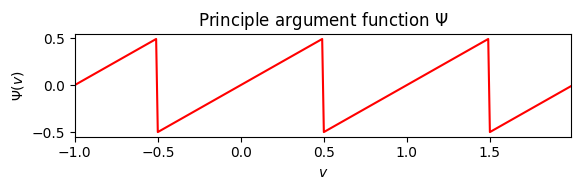

In [29]:
v = np.arange(-1,2,0.01)

plt.figure(figsize=(6,2))
plt.plot(v, principal_argument(v), 'r')
plt.title(r'Principle argument function $\Psi$')
plt.xlabel(r'$v$')
plt.ylabel(r'$\Psi(v)$')
plt.xlim([v[0], v[-1]])
plt.tight_layout()

### 위상 기반 노벨티 함수

- 주요 편각 함수(principle argument function)를 사용하여 **1차 위상차**(first-order phase difference)와 **2차 위상차**(second-order phase difference)를 다음과 같이 정의한다.

$$\varphi'(n,k) := \Psi\big(\varphi(n,k)- \varphi(n-1,k)\big), \\
\varphi''(n,k) := \Psi\big(\varphi'(n,k)- \varphi'(n-1,k)\big).$$

- 위에서 언급한 바와 같이, $x$의 정상(steady) 영역에서 프레임별 위상차는 거의 일정하게 유지되며, 이는 $\varphi''(n,k)\approx 0$를 의미한다. 그러나 트랜지언트 영역에서 위상은 전체 주파수 범위에서 상당히 예측할 수 없게 동작한다. 결과적으로 $\varphi''(n,k)$ (for $k\in[0:K]$) 값의 동시적 교란은 음 온셋에 대한 좋은 지표이다.

- 이 관찰로부터 **위상 기반(phase-based) 노벨티 함수** $\Delta_\mathrm{Phase}$를 다음과 같이 정의한다.
$$\Delta_\mathrm{Phase}(n) = \sum_{k=0}^{K} |\varphi''(n,k)|$$
for $n\in\mathbb{Z}$.

- 주요 편각 함수를 사용하여 위상 래핑으로 인한 불연속성을 처리할 수 있다. 단점으로는 주요 편각 함수가 음 온셋으로 인한 위상 차이의 큰 불연속성을 상쇄할 수도 있다. 그러나 모든 주파수 지수에 대한 위상차의 합을 고려할 것이기 때문에 이 효과는 약화된다.

### 구현

- 다음 코드 셀에서 위상 기반 노벨티 함수를 계산한다. 스펙트럼 기반 노벨티 함수의 경우, 로컬 평균을 빼고 곡선을 최대값으로 나누어 노벨티 곡선을 추가로 후처리할 수 있다.

In [30]:
def compute_novelty_phase(x, Fs=1, N=1024, H=64, M=40, norm=True):
    """Compute phase-based novelty function

    Args:
        x (np.ndarray): Signal
        Fs (scalar): Sampling rate (Default value = 1)
        N (int): Window size (Default value = 1024)
        H (int): Hop size (Default value = 64)
        M (int): Determines size (2M+1) in samples of centric window  used for local average (Default value = 40)
        norm (bool): Apply max norm (if norm==True) (Default value = True)

    Returns:
        novelty_phase (np.ndarray): Energy-based novelty function
        Fs_feature (scalar): Feature rate
    """
    X = librosa.stft(y=x, n_fft=N, hop_length=H, win_length=N, window='hann')
    Fs_feature = Fs / H
    phase = np.angle(X) / (2*np.pi)
    phase_diff = principal_argument(np.diff(phase, axis=1))
    phase_diff2 = principal_argument(np.diff(phase_diff, axis=1))
    novelty_phase = np.sum(np.abs(phase_diff2), axis=0)
    novelty_phase = np.concatenate((novelty_phase, np.array([0, 0])))
    if M > 0:
        local_average = compute_local_average(novelty_phase, M)
        novelty_phase = novelty_phase - local_average
        novelty_phase[novelty_phase < 0] = 0
    if norm:
        max_value = np.max(novelty_phase)
        if max_value > 0:
            novelty_phase = novelty_phase / max_value
    return novelty_phase, Fs_feature

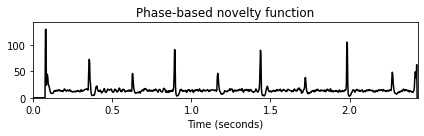

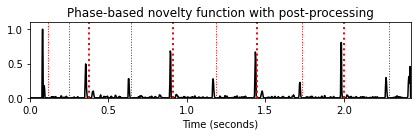

In [31]:
nov, Fs_nov = compute_novelty_phase(x, Fs=Fs, M=0, norm=0) 
plot_signal(nov, Fs_nov, color='k', 
    title='Phase-based novelty function');

nov, Fs_nov = compute_novelty_phase(x, Fs=Fs, M=10, norm=1) 
fig, ax, line = plot_signal(nov, Fs_nov, color='k', 
                    title='Phase-based novelty function with post-processing')
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                    nontime_axis=True, time_min=0, time_max=x_duration);

### 홉 크기 매개변수의 역할

- 일반적으로 위상 기반 접근 방식은 홉 크기에 매우 민감하다. 특히 큰 홉 크기를 사용하는 경우 후속 프레임에 대한 위상 예측이 종종 부정확해진다. 따라서 위상 기반 접근 방식에서는 **작은 홉 크기**를 선택하는 것이 유리하다.

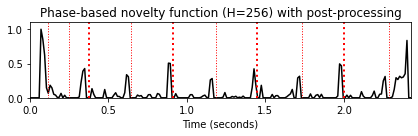

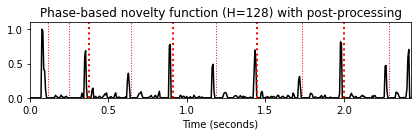

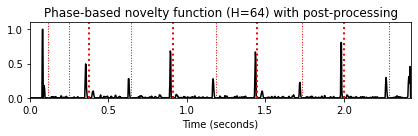

In [32]:
H_set = [256, 128, 64]

for H in H_set:
    nov, Fs_nov = compute_novelty_phase(x, Fs=Fs, N=1024, H=H, M=10, norm=1)
    fig, ax, line = plot_signal(nov, Fs_nov, color='k',
                        title='Phase-based novelty function (H=%d) with post-processing'%H)
    plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                        nontime_axis=True, time_min=0, time_max=x_duration);

## 복소 영역 노벨티 (Complex-Domain Novelty)

### 위상과 크기 (Phase and Magnitude)

- 정현파가 신호와 잘 연관되어 있는 경우, 신호 내의 정상 영역이 위상-기반 기준으로 특징지어질 수 있음을 확인했다.

- 그러나 Fourier 계수 $\mathcal{X}(n,k)$의 크기가 매우 작은 경우 위상 $\varphi(n,k)$는 잡음과 같은 작은 변동으로 인해 신호의 정상 영역 내에서도 발생할 수 있는 다소 혼란스러운 동작을 보일 수 있다. 보다 강력한 감지기를 얻기 위한 한 가지 아이디어는 스펙트럼 계수의 **크기**(magnitude)로 **위상** 정보에 가중치를 두는 것이다. 이는 위상과 크기를 공동으로 고려하는 노벨티 함수의 복소 영역 변형으로 이어진다.

- 이 변형의 가정은 위상 차이와 크기가 정상 영역에서 다소 일정하게 유지된다는 것이다. 따라서 푸리에 계수 $\mathcal{X}(n,k)$가 주어졌을 때, 다음 프레임에 대한 정상-상태(steady-state) 추정 $\hat{\mathcal{X}}(n+1,k)$를 다음과 같이 얻는다.
$$\varphi'(n,k) := \varphi(n,k)- \varphi(n-1,k), \\
   \hat{\mathcal{X}}(n+1,k) := |\mathcal{X}(n,k)|\,\, \mathrm{exp}(2\pi i(\varphi(n,k)+\varphi'(n,k)))$$

- 그런 다음 추정치 $\hat{\mathcal{X}}(n+1,k)$와 실제 계수 $\mathcal{X}(n+1,k)$ 사이의 크기를 사용하여 다음의 **노벨티 측정값**을 얻을 수 있다:
$$\mathcal{X}'(n+1,k) = |\hat{\mathcal{X}}(n+1,k)-\mathcal{X}(n+1,k)|$$

- 복소영역 차이 $\mathcal{X}'(n,k)$는 프레임 $n$ 및 계수 $k$에 대한 비정상성의 정도를 정량화한다.

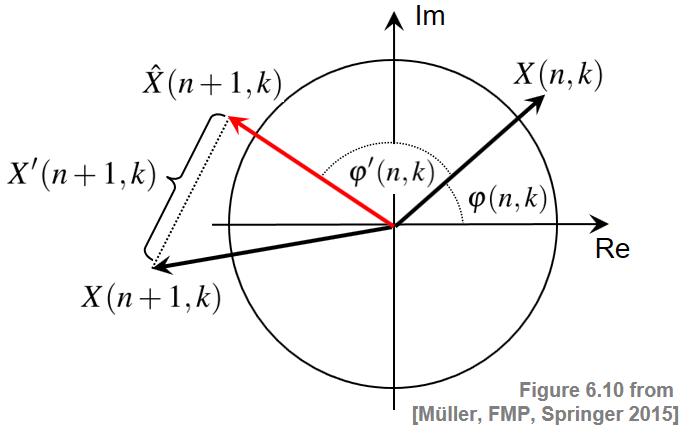

In [33]:
Image(path_img+"FMP_C6_F10.png", width=500)

### 복소 영역 노벨티 함수

- 이 수는 음 온셋(**에너지 증가**)과 노트 오프셋(**에너지 감소**)을 구별하지 않는다.

- 따라서 $\mathcal{X}'(n,k)$를 크기가 증가하는 $\mathcal{X}^+(n,k)$ 성분과 크기가 감소하는 $\mathcal{X}^-( n,k)$ 성분으로 분해한다:

$$\mathcal{X}^+(n,k) =  \left\{ \begin{array}{cl}
                \mathcal{X}'(n,k), \quad \mbox{for $|\mathcal{X}(n,k)|>|\mathcal{X}(n-1,k)|$}\\
                 0  ,\quad \mbox{otherwise,} 
                 \end{array} \right.$$
                 
$$\mathcal{X}^-(n,k) =  \left\{ \begin{array}{cl}
                \mathcal{X}'(n,k),  \quad \mbox{for $|\mathcal{X}(n,k)|\leq |\mathcal{X}(n-1,k)|$}\\
                 0  ,\quad \mbox{otherwise.} 
                 \end{array} \right.$$

- 음 온셋 감지를 위한 **복소 영역(complex-domain) 노벨티 함수** $\Delta_\mathrm{Complex}$는 모든 주파수 계수에 대해 $\mathcal{X}^+(n,k)$ 값을 합산하여 다음과 같이 정의할 수 있다.
$$\Delta_\mathrm{Complex}(n,k) = \sum_{k=0}^{K}\mathcal{X}^+(n,k)$$

- 유사하게, 일반적인 트랜지언트 또는 음 오프셋(offset)을 감지하기 위해 각각 $\mathcal{X}'(n,k)$ 또는 $\mathcal{X}^-(n,k)$를 사용하여 노벨티 함수를 계산할 수 있다.

### 구현

- 스펙트럼 기반 노벨티 함수의 경우처럼 크기의 로그 압축, 로컬 평균 빼기, 곡선을 최대값으로 나누는 정규화와 같은 추가 처리 단계를 추가할 수 있다.

In [34]:
def compute_novelty_complex(x, Fs=1, N=1024, H=64, gamma=10.0, M=40, norm=True):
    """Compute complex-domain novelty function

    Args:
        x (np.ndarray): Signal
        Fs (scalar): Sampling rate (Default value = 1)
        N (int): Window size (Default value = 1024)
        H (int): Hop size (Default value = 64)
        gamma (float): Parameter for logarithmic compression (Default value = 10.0)
        M (int): Determines size (2M+1) in samples of centric window used for local average (Default value = 40)
        norm (bool): Apply max norm (if norm==True) (Default value = True)

    Returns:
        novelty_complex (np.ndarray): Energy-based novelty function
        Fs_feature (scalar): Feature rate
    """
    X = librosa.stft(y=x, n_fft=N, hop_length=H, win_length=N, window='hann')
    Fs_feature = Fs / H
    mag = np.abs(X)
    if gamma > 0:
        mag = np.log(1 + gamma * mag)
    phase = np.angle(X) / (2*np.pi)
    phase_diff = np.diff(phase, axis=1)
    phase_diff = np.concatenate((phase_diff, np.zeros((phase.shape[0], 1))), axis=1)
    X_hat = mag * np.exp(2*np.pi*1j*(phase+phase_diff))
    X_prime = np.abs(X_hat - X)
    X_plus = np.copy(X_prime)
    for n in range(1, X.shape[0]):
        idx = np.where(mag[n, :] < mag[n-1, :])
        X_plus[n, idx] = 0
    novelty_complex = np.sum(X_plus, axis=0)
    if M > 0:
        local_average = compute_local_average(novelty_complex, M)
        novelty_complex = novelty_complex - local_average
        novelty_complex[novelty_complex < 0] = 0
    if norm:
        max_value = np.max(novelty_complex)
        if max_value > 0:
            novelty_complex = novelty_complex / max_value
    return novelty_complex, Fs_feature

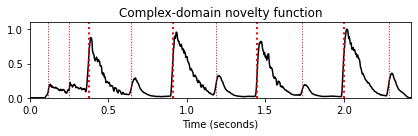

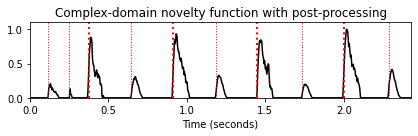

In [35]:
nov, Fs_nov = compute_novelty_complex(x, Fs=Fs, gamma=10, M=0, norm=1) 
fig, ax, line = plot_signal(nov, Fs_nov, color='k', 
                    title='Complex-domain novelty function')
plot_annotation_line(ann, ax=ax, label_keys=label_keys, 
                    nontime_axis=True, time_min=0, time_max=x_duration);

nov, Fs_nov = compute_novelty_complex(x, Fs=Fs, gamma=10, M=40, norm=1) 
fig, ax, line = plot_signal(nov, Fs_nov, color='k', 
                    title='Complex-domain novelty function with post-processing')
plot_annotation_line(ann, ax=ax, label_keys=label_keys,  
                    nontime_axis=True, time_min=0, time_max=x_duration);

## 노벨티 비교

- 위에서 소개한 네 가지 방법의 결과를 비교한다.
    * Energy-based novelty approach
    * Spectral-based novelty approach
    * Phase-based novelty approach
    * Complex-domain novelty approach

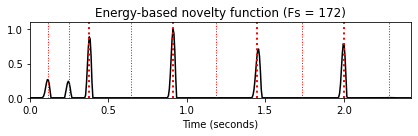

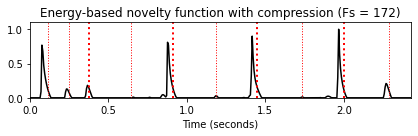

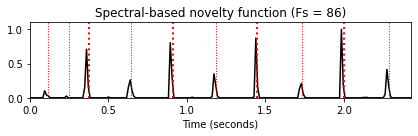

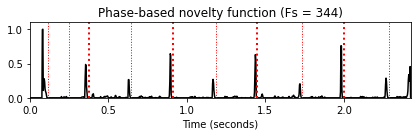

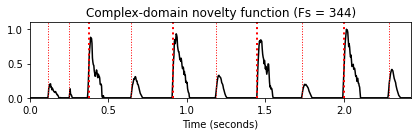

In [36]:
nov_dic = {}

nov, Fs_nov = compute_novelty_energy(x, Fs=Fs, gamma=None)
nov_dic.update( {0 : [nov, Fs_nov, r'Energy-based novelty function (Fs = %d)'%Fs_nov]} )

nov, Fs_nov = compute_novelty_energy(x, Fs=Fs, gamma=1000)
nov_dic.update( {1 : [nov, Fs_nov, 'Energy-based novelty function with compression (Fs = %d)'%Fs_nov]} )

nov, Fs_nov = compute_novelty_spectrum(x, Fs=Fs)
nov_dic.update( {2 : [nov, Fs_nov, 'Spectral-based novelty function (Fs = %d)'%Fs_nov]} )

nov, Fs_nov = compute_novelty_phase(x, Fs=Fs)
nov_dic.update( {3 : [nov, Fs_nov, 'Phase-based novelty function (Fs = %d)'%Fs_nov]} )

nov, Fs_nov = compute_novelty_complex(x, Fs=Fs)
nov_dic.update( {4 : [nov, Fs_nov, 'Complex-domain novelty function (Fs = %d)'%Fs_nov]} )

for k in nov_dic:
    fig, ax, line = plot_signal(nov_dic[k][0], Fs=nov_dic[k][1], 
                        color='k', title=nov_dic[k][2])
    plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                nontime_axis=True, time_min=0, time_max=x_duration)    

### 시간 축 리샘플링

- 서로 다른 접근법은 서로 다른 피쳐 레이트를 가진 노벨티 함수로 이어질 수 있다. 이러한 노벨티 함수를 직접 비교하거나 결합하기 위해 이제 피쳐 레이트를 조정하기 위한 **리샘플링(resampling) 방식**을 도입한다.
- 보다 일반적으로 이 접근법은 **선형 보간법 (linear interpolation)** 을 사용하여 주어진 피쳐 레이트(`Fs_in`)를 가진 입력 신호를 주어진 목표 프레임 레이트(`Fs_out`)를 가진 다른 신호로 변환한다. 예를 들어, 이 함수는 복소 영역 novelty function(feature rate $344.531~\mathrm{Hz}$)를 목표 피처 $100~\mathrm{Hz}$인 노벨티 함수로 변환하는 데 적용된다.

In [37]:
def resample_signal(x_in, Fs_in, Fs_out=100, norm=True, time_max_sec=None, sigma=None):
    """Resample and smooth signal

    Args:
        x_in (np.ndarray): Input signal
        Fs_in (scalar): Sampling rate of input signal
        Fs_out (scalar): Sampling rate of output signal (Default value = 100)
        norm (bool): Apply max norm (if norm==True) (Default value = True)
        time_max_sec (float): Duration of output signal (given in seconds) (Default value = None)
        sigma (float): Standard deviation for smoothing Gaussian kernel (Default value = None)

    Returns:
        x_out (np.ndarray): Output signal
        Fs_out (scalar): Feature rate of output signal
    """
    if sigma is not None:
        x_in = ndimage.gaussian_filter(x_in, sigma=sigma)
    T_coef_in = np.arange(x_in.shape[0]) / Fs_in
    time_in_max_sec = T_coef_in[-1]
    if time_max_sec is None:
        time_max_sec = time_in_max_sec
    N_out = int(np.ceil(time_max_sec*Fs_out))
    T_coef_out = np.arange(N_out) / Fs_out
    if T_coef_out[-1] > time_in_max_sec:
        x_in = np.append(x_in, [0])
        T_coef_in = np.append(T_coef_in, [T_coef_out[-1]])
    x_out = interp1d(T_coef_in, x_in, kind='linear')(T_coef_out)
    if norm:
        x_max = max(x_out)
        if x_max > 0:
            x_out = x_out / max(x_out)
    return x_out, Fs_out

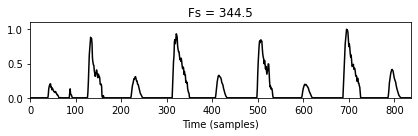

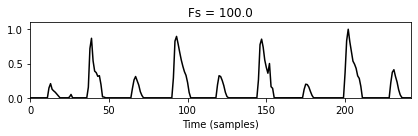

In [38]:
nov, Fs_nov = compute_novelty_complex(x, Fs)
plot_signal(nov, Fs=1, xlabel='Time (samples)', color='k', 
        title='Fs = %0.1f'%Fs_nov);

nov_out, Fs_out = resample_signal(nov, Fs_in=Fs_nov, Fs_out=100)
plot_signal(nov_out, Fs=1, xlabel='Time (samples)', color='k',
        title='Fs = %0.1f'%Fs_out);

- **선형 보간**을 통해 피쳐 레이트를 줄이는 것은 노벨티 함수가 시간에 따라 강하게 국한된(localized) 피크와 같은 구조를 갖는 경우 문제가 될 수 있다. 이 경우 리샘플링 방식에 의해 피크가 감쇠될 수 있다. 이는 위상 기반 노벨티 함수를 보여주는 다음 예를 보면 알 수 있다.

- 피크 구조를 더 잘 보존할 수 있는 한 가지 가능한 전략은 리샘플링 전에 **스무딩 필터**를 적용하는 것이다(시간적 국소화가 번지는 비용으로).

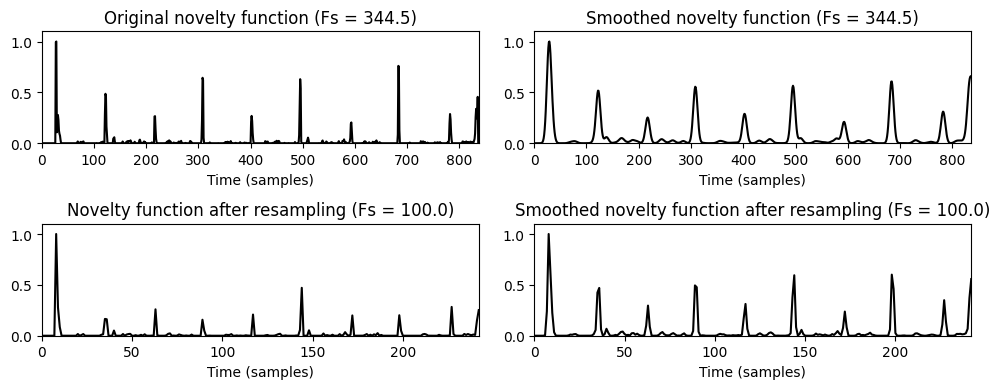

In [39]:
fig, ax = plt.subplots(2, 2, gridspec_kw={'width_ratios': [1,1], 'height_ratios': [1,1]}, 
                       figsize=(10,4))

nov, Fs_nov = compute_novelty_phase(x, Fs)
plot_signal(nov, Fs=1, ax=ax[0,0], xlabel='Time (samples)', color='k', 
        title='Original novelty function (Fs = %0.1f)'%Fs_nov)

nov_out, Fs_out = resample_signal(nov, Fs_in=Fs_nov, Fs_out=100)
plot_signal(nov_out, ax=ax[1,0], Fs=1, xlabel='Time (samples)', color='k', 
        title='Novelty function after resampling (Fs = %0.1f)'%Fs_out);

Fs_out = Fs_nov
nov_smooth, Fs_out = resample_signal(nov, Fs_in=Fs_nov, Fs_out=Fs_out, sigma=4)
plot_signal(nov_smooth, Fs=1, ax=ax[0,1], xlabel='Time (samples)', color='k', 
        title='Smoothed novelty function (Fs = %0.1f)'%Fs_nov)

Fs_out = 100
nov_smooth_out, Fs_out = resample_signal(nov, Fs_in=Fs_nov, Fs_out=Fs_out, sigma=2)
plot_signal(nov_smooth_out, ax=ax[1,1], Fs=1, xlabel='Time (samples)', color='k', 
        title='Smoothed novelty function after resampling (Fs = %0.1f)'%Fs_out);

plt.tight_layout()

### 행렬 기반 시각화와 평균화

- 서로 다른 노벨티 함수를 공통 이산 시간 축으로 변환한 후 이 함수들을 색상 형식으로 쉽게 시각화할 수 있다.

In [40]:
def average_nov_dic(nov_dic, time_max_sec, Fs_out=100, norm=True, sigma=None):
    """Average respamples set of novelty functions

    Args:
        nov_dic (dict): Dictionary of novelty functions
        time_max_sec (float): Duration of output signals (given in seconds)
        Fs_out (scalar): Sampling rate of output signal (Default value = 100)
        norm (bool): Apply max norm (if norm==True) (Default value = True)
        sigma (float): Standard deviation for smoothing Gaussian kernel (Default value = None)

    Returns:
        nov_matrix (np.ndarray): Matrix containing resampled output signal (last one is average)
        Fs_out (scalar): Sampling rate of output signals
    """
    nov_num = len(nov_dic)
    N_out = int(np.ceil(time_max_sec*Fs_out))
    nov_matrix = np.zeros([nov_num + 1, N_out])
    for k in range(nov_num):
        nov = nov_dic[k][0]
        Fs_nov = nov_dic[k][1]
        nov_out, Fs_out = resample_signal(nov, Fs_in=Fs_nov, Fs_out=Fs_out,
                                          time_max_sec=time_max_sec, sigma=sigma)
        nov_matrix[k, :] = nov_out
    nov_average = np.sum(nov_matrix, axis=0)/nov_num
    if norm:
        max_value = np.max(nov_average)
        if max_value > 0:
            nov_average = nov_average / max_value
    nov_matrix[nov_num, :] = nov_average
    return nov_matrix, Fs_out

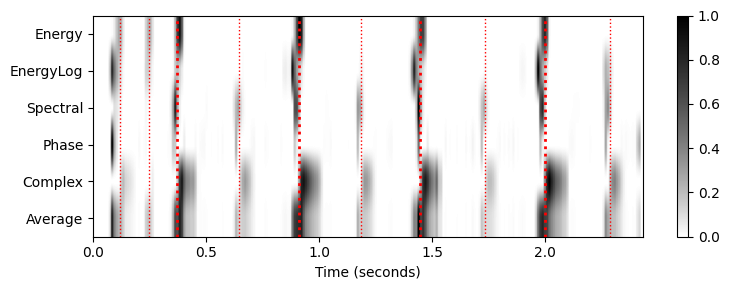

In [41]:
cmap = compressed_gray_cmap(alpha=1)
Fs_out = 100
nov_matrix, Fs_out = average_nov_dic(nov_dic, time_max_sec=x_duration, Fs_out=Fs_out)

plt.figure(figsize=[8,3])
ax = plt.subplot(1,1,1)
im = ax.imshow(nov_matrix, cmap=cmap, aspect='auto', clim=[0,1],
          extent=[0, x_duration, nov_matrix.shape[0]+0.5, 0.5])
ax.set_xlabel('Time (seconds)')
ax.set_yticks([1,2,3,4,5,6])
ax.set_yticklabels([r'Energy', r'EnergyLog', r'Spectral', r'Phase', r'Complex', r'Average'])
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                    nontime_axis=True, time_min=0, time_max=x_duration);
plt.colorbar(im)
plt.tight_layout()

- 앞에서 언급했듯이 노벨티 곡선을 리샘플링하기 전에 **스무딩 필터(smoothing filter)** 를 적용하는 것이 도움이 될 수 있다. 또한 스무딩은 평균화를 다양한 노벨티 함수에 걸친 작은 시간적 편차에 덜 취약하게 만든다. 미분 이전과 고조파 합산 적용 이전에 유사한 스무딩 전략이 사용된다. 

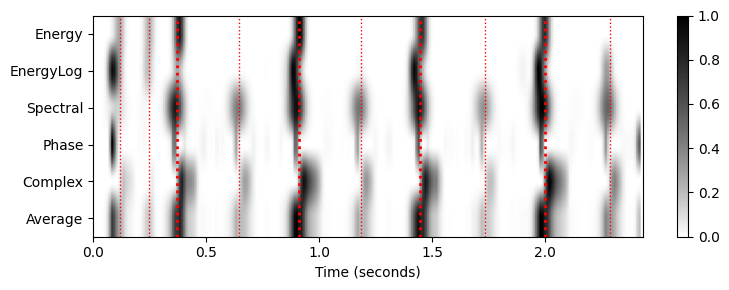

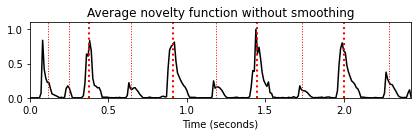

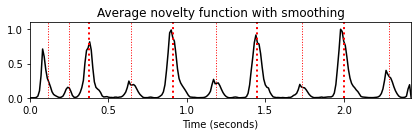

In [42]:
Fs_out = 100
sigma = 2

nov_matrix_smooth, Fs_out = average_nov_dic(nov_dic, time_max_sec=x_duration, 
                                            Fs_out=Fs_out, sigma=sigma)

plt.figure(figsize=[8,3])
ax = plt.subplot(1,1,1)
im = ax.imshow(nov_matrix_smooth, cmap=cmap, aspect='auto', clim=[0,1],
          extent=[0, x_duration, nov_matrix.shape[0]+0.5, 0.5])
ax.set_xlabel('Time (seconds)')
ax.set_yticks([1,2,3,4,5,6])
ax.set_yticklabels([r'Energy', r'EnergyLog', r'Spectral', r'Phase', r'Complex', r'Average'])
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                    nontime_axis=True, time_min=0, time_max=x_duration);
plt.colorbar(im)
plt.tight_layout()

fig, ax, line = plot_signal(nov_matrix[-1,:], Fs=Fs_out, 
                        color='k', title='Average novelty function without smoothing')
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                nontime_axis=True, time_min=0, time_max=x_duration)    

fig, ax, line = plot_signal(nov_matrix_smooth[-1,:], Fs=Fs_out, 
                        color='k', title='Average novelty function with smoothing')
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                nontime_axis=True, time_min=0, time_max=x_duration);

## 다른 예

### Note C4
- piano trumpet violin flute

In [43]:
fn_ann = 'FMP_C6_F04_NoteC4_PTVF.csv'
ann, label_keys = read_annotation_pos(path_data+fn_ann, label='onset', header=0)

fn_wav = 'FMP_C6_F04_NoteC4_PTVF.wav'
x, Fs = librosa.load(path_data+fn_wav)
x_dur = len(x)/Fs

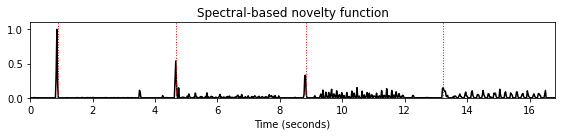

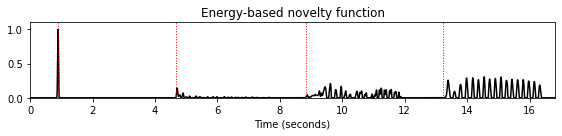

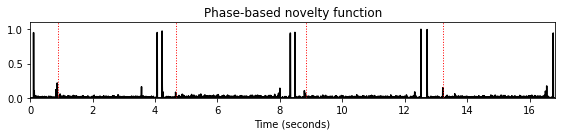

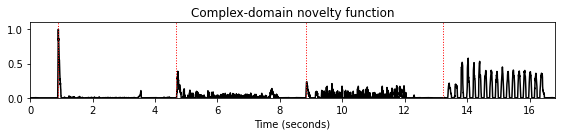

In [44]:
N, H = 2048, 512
gamma = 10
figsize=(8,2)

nov, Fs_nov = compute_novelty_spectrum(x, Fs=Fs, N=N, H=H, gamma=gamma)
fig, ax, line = plot_signal(nov, Fs_nov, figsize=figsize, color='k', 
    title='Spectral-based novelty function');
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                nontime_axis=True, time_min=0, time_max=x_dur);

nov, Fs_nov = compute_novelty_energy(x, Fs=Fs, gamma=None)
fig, ax, line = plot_signal(nov, Fs_nov, figsize=figsize, color='k', 
    title='Energy-based novelty function');
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                nontime_axis=True, time_min=0, time_max=x_dur);

nov, Fs_nov = compute_novelty_phase(x, Fs=Fs)
fig, ax, line = plot_signal(nov, Fs_nov, figsize=figsize, color='k', 
    title='Phase-based novelty function');
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                nontime_axis=True, time_min=0, time_max=x_dur);

nov, Fs_nov = compute_novelty_complex(x, Fs=Fs)
fig, ax, line = plot_signal(nov, Fs_nov, figsize=figsize, color='k', 
    title='Complex-domain novelty function');
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                nontime_axis=True, time_min=0, time_max=x_dur);
Audio(data=x,rate=Fs)

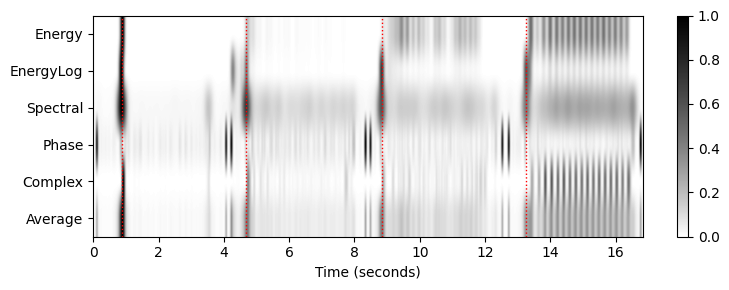

In [45]:
nov_dic = {}

nov, Fs_nov = compute_novelty_energy(x, Fs=Fs, gamma=None)
nov_dic.update( {0 : [nov, Fs_nov, 'Energy-based novelty function']} )

nov, Fs_nov = compute_novelty_energy(x, Fs=Fs, gamma=1000)
nov_dic.update( {1 : [nov, Fs_nov, 'Energy-based novelty function with compression']} )

nov, Fs_nov = compute_novelty_spectrum(x, Fs=Fs)
nov_dic.update( {2 : [nov, Fs_nov, 'Spectral-based novelty function']} )

nov, Fs_nov = compute_novelty_phase(x, Fs=Fs)
nov_dic.update( {3 : [nov, Fs_nov, 'Phase-based novelty function']} )

nov, Fs_nov = compute_novelty_complex(x, Fs=Fs)
nov_dic.update( {4 : [nov, Fs_nov, 'Complex-domain novelty function']} )

Fs_out = 100
sigma = 8
nov_matrix_smooth, Fs_out = average_nov_dic(nov_dic, time_max_sec=x_dur, 
                                            Fs_out=Fs_out, sigma=sigma)

plt.figure(figsize=[8,3])
ax = plt.subplot(1,1,1)
im = ax.imshow(nov_matrix_smooth, cmap=cmap, aspect='auto', clim=[0,1],
          extent=[0, x_dur, nov_matrix.shape[0]+0.5, 0.5])
ax.set_xlabel('Time (seconds)')
ax.set_yticks([1,2,3,4,5,6])
ax.set_yticklabels([r'Energy', r'EnergyLog', r'Spectral', r'Phase', r'Complex', r'Average'])
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                    nontime_axis=True, time_min=0, time_max=x_dur);
plt.colorbar(im)
plt.tight_layout()

### Shostakovich Waltz

In [46]:
fn_ann = 'FMP_C6_F07_Shostakovich_Waltz-02-Section_IncreasingTempo.csv'
ann, label_keys = read_annotation_pos(path_data+fn_ann, label='onset', header=0)

fn_wav = 'FMP_C6_F07_Shostakovich_Waltz-02-Section_IncreasingTempo.wav'
x, Fs = librosa.load(path_data+fn_wav)
x_dur = len(x)/Fs

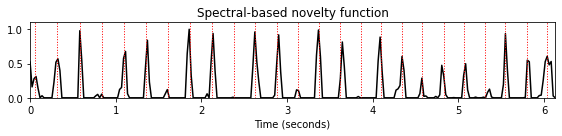

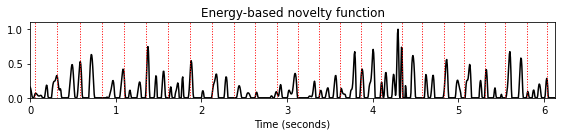

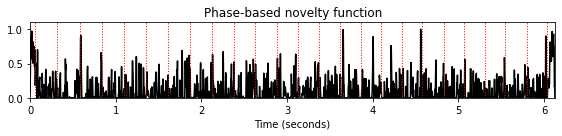

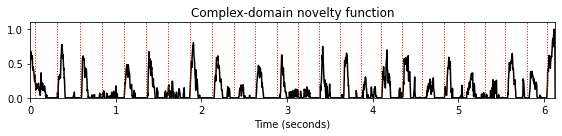

In [47]:
N, H = 2048, 512
gamma = 10
figsize=(8,2)

nov, Fs_nov = compute_novelty_spectrum(x, Fs=Fs, N=N, H=H, gamma=gamma)
fig, ax, line = plot_signal(nov, Fs_nov, figsize=figsize, color='k', 
    title='Spectral-based novelty function');
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                nontime_axis=True, time_min=0, time_max=x_dur);

nov, Fs_nov = compute_novelty_energy(x, Fs=Fs, gamma=None)
fig, ax, line = plot_signal(nov, Fs_nov, figsize=figsize, color='k', 
    title='Energy-based novelty function');
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                nontime_axis=True, time_min=0, time_max=x_dur);

nov, Fs_nov = compute_novelty_phase(x, Fs=Fs)
fig, ax, line = plot_signal(nov, Fs_nov, figsize=figsize, color='k', 
    title='Phase-based novelty function');
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                nontime_axis=True, time_min=0, time_max=x_dur);

nov, Fs_nov = compute_novelty_complex(x, Fs=Fs)
fig, ax, line = plot_signal(nov, Fs_nov, figsize=figsize, color='k', 
    title='Complex-domain novelty function');
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                nontime_axis=True, time_min=0, time_max=x_dur);
Audio(data=x,rate=Fs)

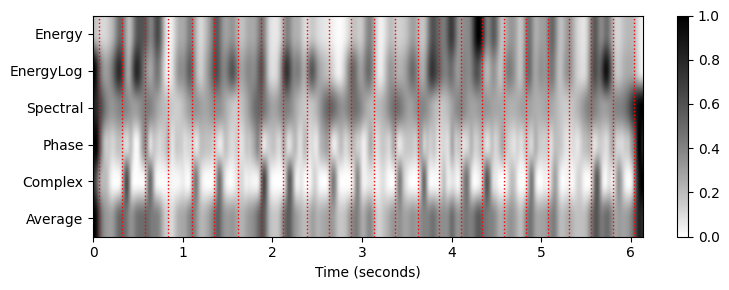

In [48]:
nov_dic = {}

nov, Fs_nov = compute_novelty_energy(x, Fs=Fs, gamma=None)
nov_dic.update( {0 : [nov, Fs_nov, 'Energy-based novelty function']} )

nov, Fs_nov = compute_novelty_energy(x, Fs=Fs, gamma=1000)
nov_dic.update( {1 : [nov, Fs_nov, 'Energy-based novelty function with compression']} )

nov, Fs_nov = compute_novelty_spectrum(x, Fs=Fs)
nov_dic.update( {2 : [nov, Fs_nov, 'Spectral-based novelty function']} )

nov, Fs_nov = compute_novelty_phase(x, Fs=Fs)
nov_dic.update( {3 : [nov, Fs_nov, 'Phase-based novelty function']} )

nov, Fs_nov = compute_novelty_complex(x, Fs=Fs)
nov_dic.update( {4 : [nov, Fs_nov, 'Complex-domain novelty function']} )

Fs_out = 100
sigma = 8
nov_matrix_smooth, Fs_out = average_nov_dic(nov_dic, time_max_sec=x_dur, 
                                            Fs_out=Fs_out, sigma=sigma)

plt.figure(figsize=[8,3])
ax = plt.subplot(1,1,1)
im = ax.imshow(nov_matrix_smooth, cmap=cmap, aspect='auto', clim=[0,1],
          extent=[0, x_dur, nov_matrix.shape[0]+0.5, 0.5])
ax.set_xlabel('Time (seconds)')
ax.set_yticks([1,2,3,4,5,6])
ax.set_yticklabels([r'Energy', r'EnergyLog', r'Spectral', r'Phase', r'Complex', r'Average'])
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                    nontime_axis=True, time_min=0, time_max=x_dur);
plt.colorbar(im)
plt.tight_layout()

- 스펙트럼 기반이 가장 온셋을 가장 잘나타내는 모습이다.

# 피크 선택 (Peak-Picking)

- 앞에서 노벨티 함수의 **피크(peak)**(잘 정의된 로컬 최대값)의 위치가 온셋 위치에 대한 좋은 지표라고 논의했다. 유사하게, 음악 구조 분석의 맥락에서, 노벨티 함수의 피크 위치는 음악 부분 사이의 세그먼트 경계를 도출하는 데 사용되었다.

- 노벨티 함수가 "impulse-like"하고 잘 분리된 피크를 갖는 명확한 피크 구조를 갖는 경우, 피크 선택은 간단한 문제로 보인다. 그러나 실제로는 가짜 피크가 많은 다소 노이지한 노벨티 함수를 처리해야 하는 경우가 많다. 이러한 상황에서 **피크 선택**에 사용되는 전략은 일반적으로 최종 감지(detection) 또는 분할 결과의 퀄리티에 상당한 영향을 미친다.

* 종종 간단한 **스무딩** 작업이 노벨티 함수에서 잡음과 같은 변동의 영향을 줄이는 데 도움이 될 수 있다. 또한 **적응적 임계값 설정 (adaptive thresholding)** 전략으로 그 값이 노벨티 함수의 로컬 평균을 초과할 때만 피크를 선택하는 방식을 적용할 수 있다. 가짜 피크의 수를 더 줄이기 위한 또 다른 전략은 두 후속 피크 위치 사이의 **최소 거리**에 제약을 가하는 것이다.

- 다음에서는 다양한 휴리스틱을 기반으로 하고 다양한 매개변수에 따라 달라지는 몇 가지 피크 선택 전략을 소개한다.

- 그 자체로 최상의 피크 선택 전략은 없다는 점에 유의하는 것이 중요하다. 피크 선택 전략의 적합성은 염두에 두고 있는 응용의 요구 사항에 따라 크게 달라진다. 한편으로 부적합한 휴리스틱 및 매개변수 선택으로 인해 예상치 못한 원치 않는 결과가 발생할 수 있는 반면 피크 선택 단계에서 특정 데이터 통계(예: 두 개의 후속 피크의 최소 거리)를 활용하면 상당한 개선을 가져올 수 있다. 따라서 MIR 시스템을 구축할 때 피크 선택 전략의 세부 사항과 파라미터의 섬세한 상호 작용을 아는 것이 필수적이다.

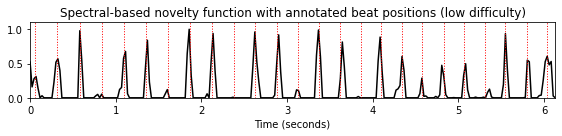

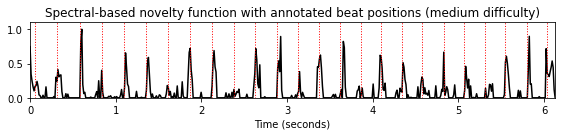

In [49]:
fn_ann = 'FMP_C6_F07_Shostakovich_Waltz-02-Section_IncreasingTempo.csv'
ann, label_keys = read_annotation_pos(path_data+fn_ann, label='onset', header=0)

fn_wav = 'FMP_C6_F07_Shostakovich_Waltz-02-Section_IncreasingTempo.wav'
x, Fs = librosa.load(path_data+fn_wav)
x_duration = len(x)/Fs

N, H = 2048, 512
gamma = 10
nov, Fs_nov = compute_novelty_spectrum(x, Fs=Fs, N=N, H=H, gamma=gamma)
figsize=(8,2)
fig, ax, line = plot_signal(nov, Fs_nov, figsize=figsize, color='k', 
    title='Spectral-based novelty function with annotated beat positions (low difficulty)');
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                nontime_axis=True, time_min=0, time_max=x_duration);

N, H = 1024, 256
gamma = 10
nov, Fs_nov = compute_novelty_spectrum(x, Fs=Fs, N=N, H=H, gamma=gamma)
figsize=(8,2)
fig, ax, line = plot_signal(nov, Fs_nov, figsize=figsize, color='k', 
    title='Spectral-based novelty function with annotated beat positions (medium difficulty)');
plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                nontime_axis=True, time_min=0, time_max=x_duration);

## 피크 선택: 간단한 방식

- 직관적으로 피크 또는 로컬 최대값은 노벨티 곡선이 증가하는 상태(양의 미분)에서 감소하는 상태(음의 미분)로 변하는 특성을 특징으로 한다.

- 다음 코드 셀에서는 이러한 모든 전환점을 찾는 첫 번째 간단한 피크 선택 방식을 정의한다. 또한 지정된 임계값 아래에 있는 피크를 버린다.

In [50]:
def peak_picking_simple(x, threshold=None):
    """Peak picking strategy looking for positions with increase followed by descrease

    Args:
        x (np.ndarray): Input function
        threshold (float): Lower threshold for peak to survive

    Returns:
        peaks (np.ndarray): Array containing peak positions
    """
    peaks = []
    if threshold is None:
        threshold = np.min(x) - 1
    for i in range(1, x.shape[0] - 1):
        if x[i - 1] < x[i] and x[i] > x[i + 1]:
            if x[i] >= threshold:
                peaks.append(i)
    peaks = np.array(peaks)
    return peaks


def plot_function_peak_positions(nov, Fs_nov, peaks, title='', figsize=(8,2)):
    peaks_sec = peaks/Fs_nov
    fig, ax, line = plot_signal(nov, Fs_nov, figsize=figsize, color='k', title=title);
    plt.vlines(peaks_sec, 0, 1.1, color='r', linestyle=':', linewidth=1);

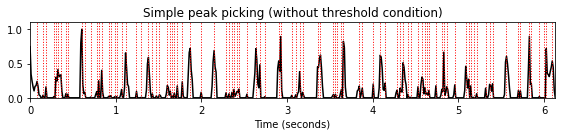

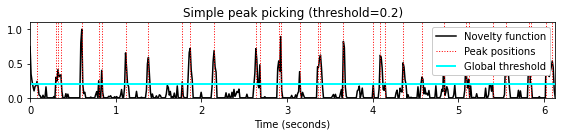

In [51]:
peaks = peak_picking_simple(nov, threshold=None)
title='Simple peak picking (without threshold condition)'
plot_function_peak_positions(nov, Fs_nov, peaks, title)

threshold = 0.2
peaks = peak_picking_simple(nov, threshold=threshold)
title='Simple peak picking (threshold=%.1f)'%threshold
plot_function_peak_positions(nov, Fs_nov, peaks, title)
plt.hlines(threshold, 0, x_duration, color='cyan', linewidth=2);
plt.legend(['Novelty function',  'Peak positions',  'Global threshold'], 
           loc='upper right', framealpha=1);

## 피크 선택: MSAF

- 노이즈와 같은 변동의 영향을 줄이려면 노벨티 함수에 스무딩 필터를 적용하는 것이 종종 유리하다. 또한, 노이즈와 같은 작은 피크를 폐기하기 위한 전역 임계값을 고려하는 대신, **적응(adaptive) 임계값 설정**의 아이디어는 해당 값이 노벨티 함수의 로컬 평균을 초과하는 경우에만 피크를 선택하는 것이다.

- 이 두 전략의 조합은 Python 패키지 [MSAF(Music Structure Analysis Framework)](https://github.com/urinieto/msaf)에서 사용되는 다음과 같은 피크 선택 방식에 적용된다.

In [52]:
def peak_picking_MSAF(x, median_len=16, offset_rel=0.05, sigma=4.0):
    """Peak picking strategy following MSFA using an adaptive threshold (https://github.com/urinieto/msaf)

    Args:
        x (np.ndarray): Input function
        median_len (int): Length of media filter used for adaptive thresholding (Default value = 16)
        offset_rel (float): Additional offset used for adaptive thresholding (Default value = 0.05)
        sigma (float): Variance for Gaussian kernel used for smoothing the novelty function (Default value = 4.0)

    Returns:
        peaks (np.ndarray): Peak positions
        x (np.ndarray): Local threshold
        threshold_local (np.ndarray): Filtered novelty curve
    """
    offset = x.mean() * offset_rel
    x = gaussian_filter1d(x, sigma=sigma)
    threshold_local = median_filter(x, size=median_len) + offset
    peaks = []
    for i in range(1, x.shape[0] - 1):
        if x[i - 1] < x[i] and x[i] > x[i + 1]:
            if x[i] > threshold_local[i]:
                peaks.append(i)
    peaks = np.array(peaks)
    return peaks, x, threshold_local

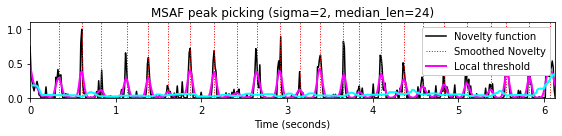

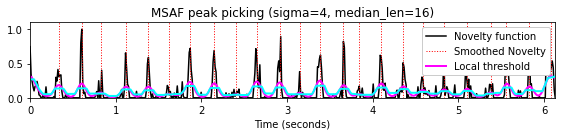

In [53]:
median_len = 24
sigma = 2
peaks, x_smooth, threshold_local = peak_picking_MSAF(nov, median_len=median_len, 
                                                     offset_rel=0.05, sigma=sigma)
title='MSAF peak picking (sigma=%1.0f, median_len=%2.0f)'%(sigma, median_len)
plot_function_peak_positions(nov, Fs_nov, peaks, title)
t = np.arange(nov.shape[0]) / Fs_nov 
plt.plot(t, x_smooth, color='magenta', linewidth=2);
plt.plot(t, threshold_local, color='cyan', linewidth=2);
plt.legend(['Novelty function', 'Smoothed Novelty', 'Local threshold'], 
           loc='upper right', framealpha=1);

median_len = 16
sigma = 4
peaks, x_smooth, threshold_local = peak_picking_MSAF(nov, median_len=median_len, 
                                                     offset_rel=0.05, sigma=sigma)
title='MSAF peak picking (sigma=%1.0f, median_len=%2.0f)'%(sigma, median_len)
plot_function_peak_positions(nov, Fs_nov, peaks, title)
t = np.arange(nov.shape[0]) / Fs_nov 
plt.plot(t, x_smooth, color='magenta', linewidth=2);
plt.plot(t, threshold_local, color='cyan', linewidth=2);
plt.legend(['Novelty function',  'Smoothed Novelty', 'Local threshold'], 
           loc='upper right', framealpha=1);

## 피크 선택: Scipy

- `scipy`의 신호 처리 패키지 `scipy.signal`에 `find_peaks`라는 피크 선택 함수가 있다. 이 함수는 1차원 배열을 사용하고 이웃 값의 단순 비교를 통해 모든 로컬 최대값을 찾는다. 선택적으로 피크 속성에 대한 조건을 지정하여 이러한 피크의 하위 집합을 선택할 수 있다.

- `prominence` 매개변수는 피크가 신호의 주변 기준선에서 얼마나 두드러지는지를 나타내는 피크 속성에 해당하며, 피크와 가장 낮은 등고선 사이의 수직 거리로 정의된다.

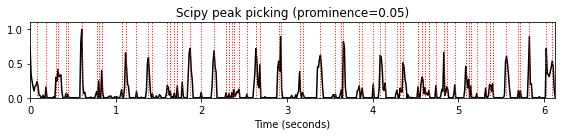

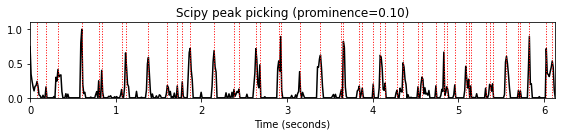

In [54]:
prominence = 0.05
peaks = signal.find_peaks(nov, prominence=prominence)[0]
title='Scipy peak picking (prominence=%.2f)'%prominence
plot_function_peak_positions(nov, Fs_nov, peaks, title)

prominence = 0.1
peaks = signal.find_peaks(nov, prominence=prominence)[0]
title='Scipy peak picking (prominence=%.2f)'%prominence
plot_function_peak_positions(nov, Fs_nov, peaks, title)

- `height` 매개변수는 필요한 피크 높이를 지정한다. 그것은 숫자일 수도, `None`일수도, 시퀀스와 일치하는 배열, 또는 전자의 두-요소 시퀀스일수도 있다. 첫 번째 요소는 항상 최소값으로 해석되고 두 번째 요소(제공된 경우)는 필요한 최대 높이로 해석된다.

- 다음 코드 셀에서 전역적으로 정의된 임계값(최소 및 최대 높이)과 로컬로 정의된 임계값 곡선(MSAF 피크 선택 접근 방식과 유사)의 두 가지 예를 보자.

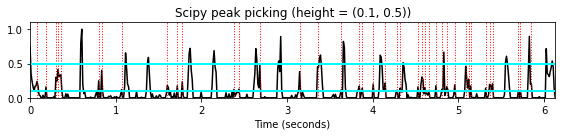

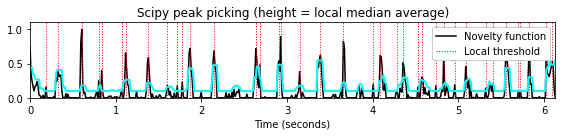

In [55]:
height = (0.1, 0.5)
peaks = signal.find_peaks(nov, height=height)[0]
title='Scipy peak picking (height = (%.1f, %.1f))'%(height[0],height[1])
plot_function_peak_positions(nov, Fs_nov, peaks, title)
plt.hlines(height[0], 0, x_duration, color='cyan', linewidth=2);
plt.hlines(height[1], 0, x_duration, color='cyan', linewidth=2);

height = median_filter(nov, size=8) + 0.1
peaks = signal.find_peaks(nov, height=height)[0]
title='Scipy peak picking (height = local median average)'
plot_function_peak_positions(nov, Fs_nov, peaks, title)
t = np.arange(nov.shape[0]) / Fs_nov 
plt.plot(t, height, color='cyan', linewidth=2);
plt.legend(['Novelty function', 'Local threshold'], 
           loc='upper right', framealpha=1);

- `distance` 매개변수는 인접한 피크 사이에 필요한 최소 수평 거리(샘플로 주어짐)를 지정한다. 이 접근 방식에서는 나머지 모든 피크에 대한 조건이 충족될 때까지 더 작은 피크가 먼저 제거된다. 이러한 거리 조건은 거리에 대한 최소 경계를 의미하는 특정 주기성 속성을 가진 신호에 특히 유용하다. 예를 들어 비트 트래킹(beat tracking)의 경우 예상 최대 템포는 인접한 두 비트 위치 사이의 최소 거리를 산출한다.

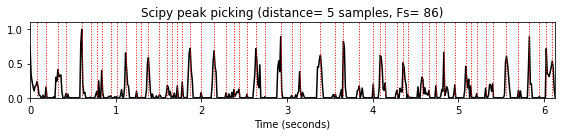

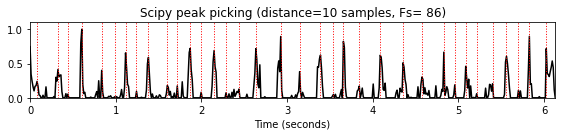

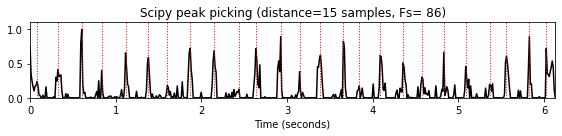

In [56]:
distance_list = [5,10,15]

for d in distance_list:
    peaks = signal.find_peaks(nov, distance=d)[0]
    title='Scipy peak picking (distance=%2.0f samples, Fs=%3.0f)'%(d, Fs_nov)
    plot_function_peak_positions(nov, Fs_nov, peaks, title)

## 피크 선택: LibROSA

- 파이썬 라이브러리 LibROSA는 피크 선택 함수 [`librosa.util.peak_pick`]를 제공한다.

- 신호 `x`가 주어졌을 때, 다음의 3 조건이 만족됐을 때 샘플 `n`을 피크 포지션으로 정한다.
    * 로컬 이웃에서 최대: <br>
      `x[n] == max(x[n - pre_max:n + post_max])`
    * 이웃의 평균보다 충분히 큼: <br> 
      `x[n] >= mean(x[n - pre_avg:n + post_avg]) + delta`
    * 두 피크 포지션 사이에 최소 거리를 둠: <br>
      `n - previous_n > wait` (where `previous_n` is the peak position preceding `n`)

- 거리 조건은 greedy 방식으로 구현된다. 다양한 조건의 상호 작용(greedy 구현과 함께)은 눈에 띄는 피크가 거부될 수 있는 결과를 초래할 수 있다(밑의 예를 보자).

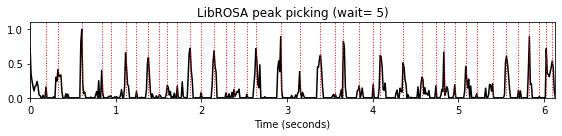

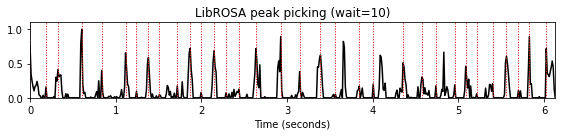

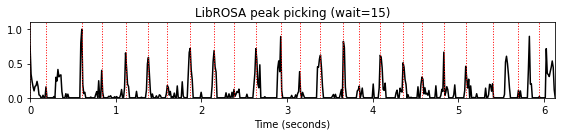

In [57]:
wait_list = [5,10,15]
for wait in wait_list:
    peaks = librosa.util.peak_pick(nov, pre_max=5, post_max=5, pre_avg=5, post_avg=5, 
                                   delta=0.01, wait=wait)
    title='LibROSA peak picking (wait=%2.0f)'%wait
    plot_function_peak_positions(nov, Fs_nov, peaks, title)

## 피크 선택: Boeck

- 다음의 피크 선택 방법은  Böck, Krebs, and Schedl의 논문 [Online Capabilities of Onset Detection Methods](https://zenodo.org/record/1416036#.Xs0ImToza9I)에 소개된 방법이다.

In [58]:
def peak_picking_boeck(activations, threshold=0.5, fps=100, include_scores=False, combine=False,
                       pre_avg=12, post_avg=6, pre_max=6, post_max=6):
    """Detects peaks.
    | Implements the peak-picking method described in:
    | "Evaluating the Online Capabilities of Onset Detection Methods"
    | Sebastian Boeck, Florian Krebs and Markus Schedl
    | Proceedings of the 13th International Society for Music Information Retrieval Conference (ISMIR), 2012
    Modified by Jan Schlueter, 2014-04-24
    Args:
        activations (np.nadarray): Vector of activations to process
        threshold (float): Threshold for peak-picking (Default value = 0.5)
        fps (scalar): Frame rate of onset activation function in Hz (Default value = 100)
        include_scores (bool): Include activation for each returned peak (Default value = False)
        combine (bool): Only report 1 onset for N seconds (Default value = False)
        pre_avg (float): Use N past seconds for moving average (Default value = 12)
        post_avg (float): Use N future seconds for moving average (Default value = 6)
        pre_max (float): Use N past seconds for moving maximum (Default value = 6)
        post_max (float): Use N future seconds for moving maximum (Default value = 6)
    Returns:
        peaks (np.ndarray): Peak positions
    """

    activations = activations.ravel()

    # detections are activations equal to the moving maximum
    max_length = int((pre_max + post_max) * fps) + 1
    if max_length > 1:
        max_origin = int((pre_max - post_max) * fps / 2)
        mov_max = maximum_filter1d(activations, max_length, mode='constant', origin=max_origin)
        detections = activations * (activations == mov_max)
    else:
        detections = activations

    # detections must be greater than or equal to the moving average + threshold
    avg_length = int((pre_avg + post_avg) * fps) + 1
    if avg_length > 1:
        avg_origin = int((pre_avg - post_avg) * fps / 2)
        mov_avg = uniform_filter1d(activations, avg_length, mode='constant', origin=avg_origin)
        detections = detections * (detections >= mov_avg + threshold)
    else:
        # if there is no moving average, treat the threshold as a global one
        detections = detections * (detections >= threshold)

    # convert detected onsets to a list of timestamps
    if combine:
        stamps = []
        last_onset = 0
        for i in np.nonzero(detections)[0]:
            # only report an onset if the last N frames none was reported
            if i > last_onset + combine:
                stamps.append(i)
                # save last reported onset
                last_onset = i
        stamps = np.array(stamps)
    else:
        stamps = np.where(detections)[0]

    # include corresponding activations per peak if needed
    if include_scores:
        scores = activations[stamps]
        if avg_length > 1:
            scores -= mov_avg[stamps]
        return stamps / float(fps), scores
    else:
        return stamps / float(fps)

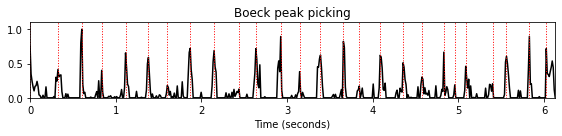

In [59]:
peaks = peak_picking_boeck(nov, threshold=0.01, fps=1, 
            include_scores=False, combine=0,
            pre_avg=0.1*Fs_nov, post_avg=0.1*Fs_nov, pre_max=0.1*Fs_nov, post_max=0.1*Fs_nov)
title='Boeck peak picking'
plot_function_peak_positions(nov, Fs_nov, peaks, title)

## 피크 선택: Roeder

- 또다른 피크 선택 방법은 Tido Röder에 의해 원래 구현된 방법이다.

In [60]:
def peak_picking_roeder(x, direction=None, abs_thresh=None, rel_thresh=None, descent_thresh=None, tmin=None, tmax=None):
    """| Computes the positive peaks of the input vector x
    | Python adaption from the Matlab Roeder_Peak_Picking script peaks.m from the internal Sync Toolbox
    | reckjn 2017
    Args:
        x (np.nadarray): Signal to be searched for (positive) peaks
        direction (int): +1 for forward peak searching, -1 for backward peak searching.
            default is dir == -1. (Default value = None)
        abs_thresh (float): Absolute threshold signal, i.e. only peaks
            satisfying x(i)>=abs_thresh(i) will be reported.
            abs_thresh must have the same number of samples as x.
            a sensible choice for this parameter would be a global or local
            average or median of the signal x.
            If omitted, half the median of x will be used. (Default value = None)
        rel_thresh (float): Relative threshold signal. Only peak positions i with an
            uninterrupted positive ascent before position i of at least
            rel_thresh(i) and a possibly interrupted (see parameter descent_thresh)
            descent of at least rel_thresh(i) will be reported.
            rel_thresh must have the same number of samples as x.
            A sensible choice would be some measure related to the
            global or local variance of the signal x.
            if omitted, half the standard deviation of W will be used.
        descent_thresh (float): Descent threshold. during peak candidate verfication, if a slope change
            from negative to positive slope occurs at sample i BEFORE the descent has
            exceeded rel_thresh(i), and if descent_thresh(i) has not been exceeded yet,
            the current peak candidate will be dropped.
            this situation corresponds to a secondary peak
            occuring shortly after the current candidate peak (which might lead
            to a higher peak value)!
            |
            | The value descent_thresh(i) must not be larger than rel_thresh(i).
            |
            | descent_thresh must have the same number of samples as x.
            a sensible choice would be some measure related to the
            global or local variance of the signal x.
            if omitted, 0.5*rel_thresh will be used. (Default value = None)
        tmin (int): Index of start sample. peak search will begin at x(tmin). (Default value = None)
        tmax (int): Index of end sample. peak search will end at x(tmax). (Default value = None)
    Returns:
        peaks (np.nadarray): Array of peak positions
    """

    # set default values
    if direction is None:
        direction = -1
    if abs_thresh is None:
        abs_thresh = np.tile(0.5*np.median(x), len(x))
    if rel_thresh is None:
        rel_thresh = 0.5*np.tile(np.sqrt(np.var(x)), len(x))
    if descent_thresh is None:
        descent_thresh = 0.5*rel_thresh
    if tmin is None:
        tmin = 1
    if tmax is None:
        tmax = len(x)

    dyold = 0
    dy = 0
    rise = 0  # current amount of ascent during a rising portion of the signal x
    riseold = 0  # accumulated amount of ascent from the last rising portion of x
    descent = 0  # current amount of descent (<0) during a falling portion of the signal x
    searching_peak = True
    candidate = 1
    P = []

    if direction == 1:
        my_range = np.arange(tmin, tmax)
    elif direction == -1:
        my_range = np.arange(tmin, tmax)
        my_range = my_range[::-1]

    # run through x
    for cur_idx in my_range:
        # get local gradient
        dy = x[cur_idx+direction] - x[cur_idx]

        if dy >= 0:
            rise = rise + dy
        else:
            descent = descent + dy

        if dyold >= 0:
            if dy < 0:  # slope change positive->negative
                if rise >= rel_thresh[cur_idx] and searching_peak is True:
                    candidate = cur_idx
                    searching_peak = False
                riseold = rise
                rise = 0
        else:  # dyold < 0
            if dy < 0:  # in descent
                if descent <= -rel_thresh[candidate] and searching_peak is False:
                    if x[candidate] >= abs_thresh[candidate]:
                        P.append(candidate)  # verified candidate as True peak
                    searching_peak = True
            else:  # dy >= 0 slope change negative->positive
                if searching_peak is False:  # currently verifying a peak
                    if x[candidate] - x[cur_idx] <= descent_thresh[cur_idx]:
                        rise = riseold + descent  # skip intermediary peak
                    if descent <= -rel_thresh[candidate]:
                        if x[candidate] >= abs_thresh[candidate]:
                            P.append(candidate)    # verified candidate as True peak
                    searching_peak = True
                descent = 0
        dyold = dy
    peaks = np.array(P)
    return peaks

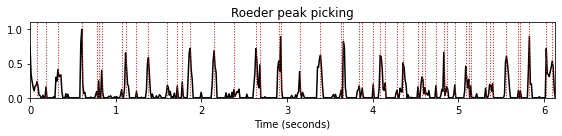

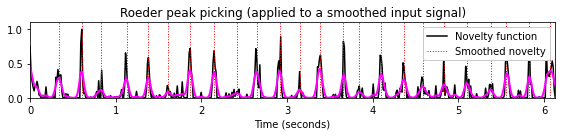

In [61]:
peaks = peak_picking_roeder(nov, direction=None, abs_thresh=None, 
                                      rel_thresh=None, descent_thresh=None, 
                                      tmin=None, tmax=None)
title='Roeder peak picking'
plot_function_peak_positions(nov, Fs_nov, peaks, title)

nov_smooth = gaussian_filter1d(nov, sigma=2)
peaks = peak_picking_roeder(nov_smooth, direction=None, abs_thresh=None, 
                                      rel_thresh=None, descent_thresh=None, 
                                      tmin=None, tmax=None)
title='Roeder peak picking (applied to a smoothed input signal)'
plot_function_peak_positions(nov, Fs_nov, peaks, title)
t = np.arange(nov.shape[0]) / Fs_nov 
plt.plot(t, nov_smooth, color='magenta', linewidth=2);
plt.legend(['Novelty function', 'Smoothed novelty'], 
           loc='upper right', framealpha=1);

## Librosa 함수 예제

In [116]:
x, sr = librosa.load('../audio/58bpm.wav')
Audio(x, rate=sr)

In [118]:
hop_length = 256
onset_envelope = librosa.onset.onset_strength(y=x, sr=sr, hop_length=hop_length)

N = len(x)
T = N/float(sr)
t = np.linspace(0, T, len(onset_envelope))

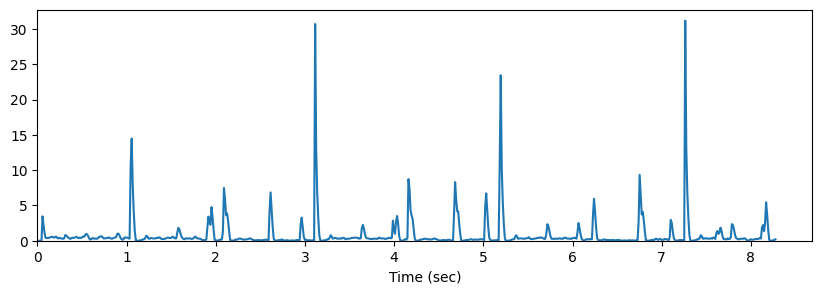

In [121]:
# onset envelop
plt.figure(figsize=(10, 3))
plt.plot(t, onset_envelope)
plt.xlabel('Time (sec)')
plt.xlim(xmin=0)
plt.ylim(0)
plt.show()

In [123]:
onset_frames = librosa.util.peak_pick(onset_envelope, pre_max=7, post_max=7, pre_avg=7, post_avg=7, delta=0.5, wait=5)
onset_frames

array([  5,  78,  91, 136, 168, 180, 225, 255, 268, 314, 347, 358, 403,
       433, 447, 492, 522, 537, 581, 611, 625, 659, 670, 703], dtype=int64)

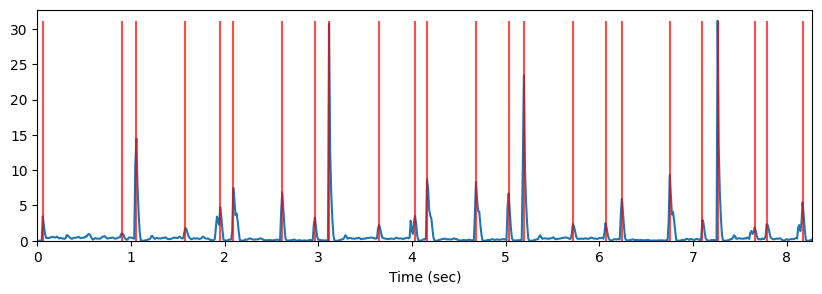

In [126]:
plt.figure(figsize=(10,3))
plt.plot(t, onset_envelope)
plt.grid(False)
plt.vlines(t[onset_frames], 0, onset_envelope.max(), color='r', alpha=0.7)
plt.xlabel('Time (sec)')
plt.xlim(0, T)
plt.ylim(0)
plt.show()

In [127]:
clicks = librosa.clicks(frames=onset_frames, sr=22050, hop_length=hop_length, length=N)
Audio(x+clicks, rate=sr)

---

출처: 

- https://www.audiolabs-erlangen.de/resources/MIR/FMP/C6/C6S1_OnsetDetection.html
- https://www.audiolabs-erlangen.de/resources/MIR/FMP/C6/C6S1_NoveltyEnergy.html
- https://www.audiolabs-erlangen.de/resources/MIR/FMP/C6/C6S1_NoveltySpectral.html
- https://www.audiolabs-erlangen.de/resources/MIR/FMP/C6/C6S1_NoveltyPhase.html
- https://www.audiolabs-erlangen.de/resources/MIR/FMP/C6/C6S1_NoveltyComplex.html
- https://www.audiolabs-erlangen.de/resources/MIR/FMP/C6/C6S1_NoveltyComparison.html
- https://colab.research.google.com/github/stevetjoa/musicinformationretrieval.com/blob/gh-pages/onset_detection.ipynb

---

[구글 Colab 링크](https://colab.research.google.com/github/jo-cho/mir_kr/blob/main/Notebooks/7.%20Tempo%20and%20Beat%20Tracking/7.1.Onset_Detection.ipynb)